## Emotion

In [134]:
# !pip install nrclex

In [30]:
from nrclex import NRCLex
import pandas as pd
import nltk
import matplotlib.dates as md
import matplotlib.pyplot as plt
import numpy as np
from wordcloud import WordCloud
import seaborn as sns
from nltk.stem import WordNetLemmatizer 
lemmatizer = WordNetLemmatizer()
from nltk.corpus import wordnet
from collections import Counter
from tqdm import tqdm
from spacy.lang.en.stop_words import STOP_WORDS
# nltk.download('wordnet')

# nltk.download('punkt')
base_url = "/scratch/si699s004w22_class_root/si699s004w22_class/yixinzh"

In [2]:
def get_wordnet_pos(word):
    """Map POS tag to first character lemmatize() accepts"""
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}

    return tag_dict.get(tag, wordnet.NOUN)

In [3]:
stop_words = ["don't", "don’t"]
def detect_emotion(text):
    lst = []
    for word in text.split():
        word = word.lower()
        if word.lower() not in stop_words:
            lst.append(lemmatizer.lemmatize(word, get_wordnet_pos(word)))
    emotion = NRCLex(" ".join(lst))
    return emotion

### NRCLEX example for reference

In [464]:
e = detect_emotion("hospital")

In [465]:
e.affect_list

['fear', 'sadness', 'trust']

In [466]:
e.affect_dict

{'hospital': ['fear', 'sadness', 'trust']}

In [529]:
e.raw_emotion_scores

{'fear': 1, 'sadness': 1, 'trust': 1}

In [534]:
sum(e.raw_emotion_scores.values())

3

In [166]:
e.top_emotions

[('fear', 0.2),
 ('anger', 0.2),
 ('surprise', 0.2),
 ('negative', 0.2),
 ('sadness', 0.2)]

In [167]:
e.affect_frequencies

{'fear': 0.2,
 'anger': 0.2,
 'anticip': 0.0,
 'trust': 0.0,
 'surprise': 0.2,
 'positive': 0.0,
 'negative': 0.2,
 'sadness': 0.2,
 'disgust': 0.0,
 'joy': 0.0}

# Tweets

In [5]:
# tweet_df = pd.read_csv(base_url + "/final_data/" + "tweet_all.csv", lineterminator="\n")
# # tweet_df.head()

In [6]:
tweet_df['date']= pd.to_datetime(tweet_df.time)

In [7]:
tweet_df.shape

(1810294, 11)

In [156]:
def add_emotion_to_df(df, column_name):
    emotion_list = []
    
    for text in tqdm(df[column_name]):
        e = detect_emotion(text)
        emotion_list.append(e)   
        
    df['emotion'] = emotion_list
    

def add_emotion_attr_to_df(df):
#     df['emotion_dic']  = df['emotion'].apply(lambda e: e.affect_dict)
#     df['affect_frequencies']  = df['emotion'].apply(lambda emo_dict: emo_dict.affect_frequencies)
    df['fear'] = df['affect_frequencies'].apply(lambda x: x.get('fear'))
    df['anger'] = df['affect_frequencies'].apply(lambda x: x.get('anger'))
    df['joy'] = df['affect_frequencies'].apply(lambda x: x.get('joy'))
    df['sadness'] = df['affect_frequencies'].apply(lambda x: x.get('sadness'))
    df['anticipation'] = df['affect_frequencies'].apply(lambda x: x.get('anticip'))
    df['surprise'] = df['affect_frequencies'].apply(lambda x: x.get('surprise'))
    df['trust'] = df['affect_frequencies'].apply(lambda x: x.get('trust'))
    df['disgust'] = df['affect_frequencies'].apply(lambda x: x.get('disgust'))
    
    
def get_emotion_word_dic(df):
    emotion_word_dic = {}
    e_type_list = ["fear", "anger", "joy", "sadness", "anticipation", "surprise" , "trust", "disgust"]

    for e_type in e_type_list:
        emotion_word_dic[e_type] = []
      
    for e in df['emotion']:
        for word in e.affect_dict.keys():
            for e_type in e.affect_dict[word]:
                if e_type != "positive" and e_type != "negative":
                    emotion_word_dic[e_type].append(word)
            
    return emotion_word_dic

In [9]:
tweet_df

,tweet_id,combined_text,time,favourites_count,followers_count,friends_count,statuses_count,rt_status,state,token_list,date
0,1223471140317909004,Veteran journo canned after making ‘racist’ jo...,02-01-2020,28128,4478,4826,42564,0,Tennessee,"['veteran', 'journo', 'racist', 'joke', 'https...",2020-02-01
1,1223471149142560773,UCSF expert working on quicker diagnostic test...,02-01-2020,2158,1126,1882,729,1,NaN,"['ucsf', 'expert', 'work', 'quicker', 'diagnos...",2020-02-01
2,1223471417578139649,RT @YahooFinance: Dr. Oz explains how to stay ...,02-01-2020,162241,264,292,168875,1,New York,"['@yahoofinance', 'dr', 'oz', 'explains', 'sta...",2020-02-01
3,1223471598755368960,Here's what did it. 👀👀👀👀👀👀\nCoronavirus? Bill ...,02-01-2020,4843,2613,3867,28471,1,Texas,"[""here's"", 'bill', 'gate', 'patent', 'run', 's...",2020-02-01
4,1223471814753443841,#BREAKING @Qantas will suspend flights to and ...,02-01-2020,553,1641,204,3788,0,Wisconsin,"['#breaking', '@qantas', 'suspend', 'flight', ...",2020-02-01
...,...,...,...,...,...,...,...,...,...,...,...
1810289,1421680845602050051,- The locking up of children in cold tight qua...,08-01-2021,217764,1761,2775,55936,1,Indiana,"['lock', 'child', 'cold', 'tight', 'quarter', ...",2021-08-01
1810290,1421681168584478722,@FoxNews As covid rages the state. Good one De...,08-01-2021,2062,48,279,7915,0,Colorado,"['@foxnews', 'rage', 'state', 'good', 'deathsa...",2021-08-01
1810291,1421681267125460995,@CoreyBrickley GIVE ME MOAR COVID JUICE,08-01-2021,37459,2593,2783,12406,0,Pennsylvania,"['@coreybrickley', 'moar', 'juice']\r",2021-08-01
1810292,1421681374919024640,Tuberculosis:The Forgotten Pandemic\nhttps://t...,08-01-2021,368,146,413,7888,1,New Jersey,"['tuberculosis', 'forgotten', 'https://t.co/rm...",2021-08-01


In [120]:
def plot_emotion_word_cloud(token_list_dic, filename):
    f = plt.figure(figsize=(60, 70))
  
    plt.rc('font', size=20) 
    n_components = len(token_list_dic)
    j = int(np.ceil(n_components/2))
    i = 1
    for each in token_list_dic:
        if each != "positive" and each != "negative":
            plt.subplot(j, 2, i)
            plt.plot()
            word_could_dict=Counter(token_list_dic[each])
            #print(word_could_dict)

            wordcloud = WordCloud().generate_from_frequencies(word_could_dict)
            plt.imshow(wordcloud)
            plt.title(each, fontsize = 50, pad=20)
            plt.axis("off")
            i += 1

    plt.show()
    
    f.savefig(base_url + "/emotion/" + filename, bbox_inches='tight')

In [36]:
def get_emotion_word_count_dict(token_list_dic):
    emotion_word_count_dict = {}
    for each in tqdm(list(token_list_dic.keys())):
        emotion_word_count_dict[each] = Counter(token_list_dic[each])
    return emotion_word_count_dict

In [37]:
def get_emotion_df_from_dic(dic, filename = None, num = 3):
    
    emotion_word_count_dic = get_emotion_word_count_dict(dic)
    
#     num = 10
    df_dic = {}

    word_list = []
    occurence_list = []
    emotion_type_list = []
    
    for each in emotion_word_count_dic:
        for t in emotion_word_count_dic[each].most_common(num):
            word_list.append(t[0])
            occurence_list.append(t[1])
            emotion_type_list.append(each)
    total = sum(occurence_list)
    freq_list = [i/total for i in occurence_list]
    df = pd.DataFrame({"word": word_list, "occurence": occurence_list, "frequence":freq_list, "emotion_type": emotion_type_list})
    if filename != None:
        df.to_csv(base_url+"/emotion/" + filename, index=False)
    return df

In [40]:
# add_emotion_to_df(tweet_df, "combined_text")
# add_emotion_attr_to_df(tweet_df)
# tweet_emotion_word_dic = get_emotion_word_dic(tweet_df)

## save

In [316]:
# with open(base_url + '/emotion/emotion_word_count_dict_all.json', 'w') as fp:
#     json.dump(emotion_word_count_dict, fp)
    
# with open(base_url + '/emotion/tweet_affect_frequencies.json', 'w') as fp:
#     json.dump(tweet_df["affect_frequencies"].tolist(), fp)
    
# with open(base_url + '/emotion/tweet_emotion_dic.json', 'w') as fp:
#     json.dump(tweet_df["emotion_dic"].tolist(), fp)
    
# with open(base_url + '/emotion/tweet_emotion_word_dic.json', 'w') as fp:
#     json.dump(tweet_emotion_word_dic, fp)
# tweet_df.to_csv(base_url+"/emotion/"+f"tweet_df.csv", index=False)

## read

In [9]:
# import json
with open(base_url + '/emotion/tweet_affect_frequencies.json', 'r') as json_file:
    affect_frequencies = json.load(json_file)

with open(base_url + '/emotion/tweet_emotion_dic.json', 'r') as json_file:
    tweet_emotion_dic = json.load(json_file)

with open(base_url + '/emotion/tweet_emotion_word_dic.json', 'r') as json_file:
    tweet_emotion_word_dic = json.load(json_file)

In [11]:
tweet_df = pd.read_csv(base_url + "/emotion/" + "tweet_df.csv", lineterminator="\n")
tweet_df.head()

,tweet_id,combined_text,time,favourites_count,followers_count,friends_count,statuses_count,rt_status,state,token_list,...,affect_frequencies,fear,anger,joy,sadness,anticip,surprise,trust,disgust,date
0,1223471140317909004,Veteran journo canned after making ‘racist’ jo...,02-01-2020,28128,4478,4826,42564,0,Tennessee,"['veteran', 'journo', 'racist', 'joke', 'https...",...,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",0.0,0.0,0.0,0.0,0.0,0.00,0.333333,0.0,2020-02-01
1,1223471149142560773,UCSF expert working on quicker diagnostic test...,02-01-2020,2158,1126,1882,729,1,NaN,"['ucsf', 'expert', 'work', 'quicker', 'diagnos...",...,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",0.0,0.0,0.0,0.0,0.0,0.00,0.285714,0.0,2020-02-01
2,1223471417578139649,RT @YahooFinance: Dr. Oz explains how to stay ...,02-01-2020,162241,264,292,168875,1,New York,"['@yahoofinance', 'dr', 'oz', 'explains', 'sta...",...,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.0,2020-02-01
3,1223471598755368960,Here's what did it. 👀👀👀👀👀👀\nCoronavirus? Bill ...,02-01-2020,4843,2613,3867,28471,1,Texas,"[""here's"", 'bill', 'gate', 'patent', 'run', 's...",...,"{'fear': 0.1, 'anger': 0.1, 'anticip': 0.0, 't...",0.1,0.1,0.0,0.1,0.0,0.05,0.200000,0.1,2020-02-01
4,1223471814753443841,#BREAKING @Qantas will suspend flights to and ...,02-01-2020,553,1641,204,3788,0,Wisconsin,"['#breaking', '@qantas', 'suspend', 'flight', ...",...,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.0,2020-02-01


In [22]:
tweet_df = tweet_df[['tweet_id', 'combined_text', 'time', 'date', 'state', 'fear', 'anger', 'joy', 'sadness', 'anticip', 'surprise', 'trust', 'disgust']]
tweet_df['affect_frequencies'] = affect_frequencies
tweet_df['emotion_dic'] = tweet_emotion_dic
tweet_df['date']=pd.to_datetime(tweet_df.date) 
tweet_df.head()

<ipython-input-22-3fbb3478c847>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweet_df['affect_frequencies'] = affect_frequencies


,tweet_id,combined_text,time,date,state,fear,anger,joy,sadness,anticip,surprise,trust,disgust,affect_frequencies,emotion_dic
0,1223471140317909004,Veteran journo canned after making ‘racist’ jo...,02-01-2020,2020-02-01,Tennessee,0.0,0.0,0.0,0.0,0.0,0.00,0.333333,0.0,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...","{'veteran': ['positive', 'trust'], 'joke': ['n..."
1,1223471149142560773,UCSF expert working on quicker diagnostic test...,02-01-2020,2020-02-01,NaN,0.0,0.0,0.0,0.0,0.0,0.00,0.285714,0.0,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...","{'expert': ['positive', 'trust'], 'virus': ['n..."
2,1223471417578139649,RT @YahooFinance: Dr. Oz explains how to stay ...,02-01-2020,2020-02-01,New York,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.0,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",{'healthy': ['positive']}
3,1223471598755368960,Here's what did it. 👀👀👀👀👀👀\nCoronavirus? Bill ...,02-01-2020,2020-02-01,Texas,0.1,0.1,0.0,0.1,0.0,0.05,0.200000,0.1,"{'fear': 0.1, 'anger': 0.1, 'anticip': 0.0, 't...","{'gate': ['trust'], 'patent': ['positive'], 'e..."
4,1223471814753443841,#BREAKING @Qantas will suspend flights to and ...,02-01-2020,2020-02-01,Wisconsin,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.0,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",{}


## Emotion words

In [13]:
def get_emtion_word_freq_by_month(df, start, end, emotion, word_num):
    sub_df = df[(df['date'] >=start) & (df['date'] <end)].copy()
    return get_emotion_word_dic(sub_df)[emotion]

In [139]:
def plot_monthly_emotion_word_freq(df, word_lst, filename = None):
    sns.set(font_scale=1)
    sns.set_style("whitegrid")
    
    fig, ax = plt.subplots(figsize=(15,15))
    
    for word in tqdm(word_lst):
        sns.lineplot(data=df[word],label=word)

    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=25)
    plt.xlabel('month', fontsize=25)
    plt.ylabel('frequency', fontsize=25)
    
    ax.set_xticks(np.arange(0, df.shape[0], step=2))   
    plt.xticks(fontsize = 18)
    plt.yticks(fontsize = 18)
    plt.show()
    if filename != None:
        plt.savefig(base_url + "/emotion/" + filename)    


### suprise

In [202]:
most_freq_suprise_words

['trump',
 'death',
 'good',
 'lose',
 'vote',
 'hope',
 'money',
 'emergency',
 'shot',
 'surge']

In [237]:
tweet_emotion_word_montly_df = tweet_emotion_word_df.groupby(['year', 'month'])[most_freq_suprise_words].mean()

100%|██████████| 10/10 [00:01<00:00,  9.97it/s]


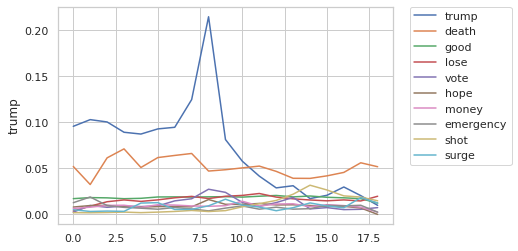

<Figure size 432x288 with 0 Axes>

In [238]:
plot_monthly_emotion_word_freq(tweet_emotion_word_montly_df.reset_index(), most_freq_suprise_words, "tweet_plot_monthly_emotion_word_line_chart.pdf")

In [217]:
bing_most_freq_suprise_words

['trump',
 'death',
 'rapid',
 'disaster',
 'urgent',
 'shot',
 'emergency',
 'sun',
 'vote',
 'leave']

In [93]:
month_list = ['2020-02',
 '2020-03',
 '2020-04',
 '2020-05',
 '2020-06',
 '2020-07',
 '2020-08',
 '2020-09',
 '2020-10',
 '2020-11',
 '2020-12',
 '2021-01',
 '2021-02',
 '2021-03',
 '2021-04',
 '2021-05',
 '2021-06',
 '2021-07',
  '2021-07']

In [96]:
def plot_emotion_keywords_monthly_line_chart(df, emotion_word_dic, emotion, filename=None):
    most_freq_emotion_words = [i[0] for i in Counter(emotion_word_dic[emotion]).most_common(10)]
    emotion_word_df = df[['date', 'emotion_dic']].copy()
    emotion_word_df['year'] = emotion_word_df['date'].dt.year
    emotion_word_df['month'] = emotion_word_df['date'].dt.month
    for word in most_freq_emotion_words:
        emotion_word_df[word] = emotion_word_df['emotion_dic'].apply(lambda emotion_dic : 0 if emotion_dic.get(word) == None else 1)
    emotion_word_montly_df = emotion_word_df.groupby(['year', 'month'])[most_freq_emotion_words].mean().reset_index()
    emotion_word_montly_df['label'] = month_list
    emotion_word_montly_df = emotion_word_montly_df.set_index('label')
    plot_monthly_emotion_word_freq(emotion_word_montly_df, most_freq_emotion_words, filename)

### surprise

100%|██████████| 10/10 [00:00<00:00, 28.88it/s]


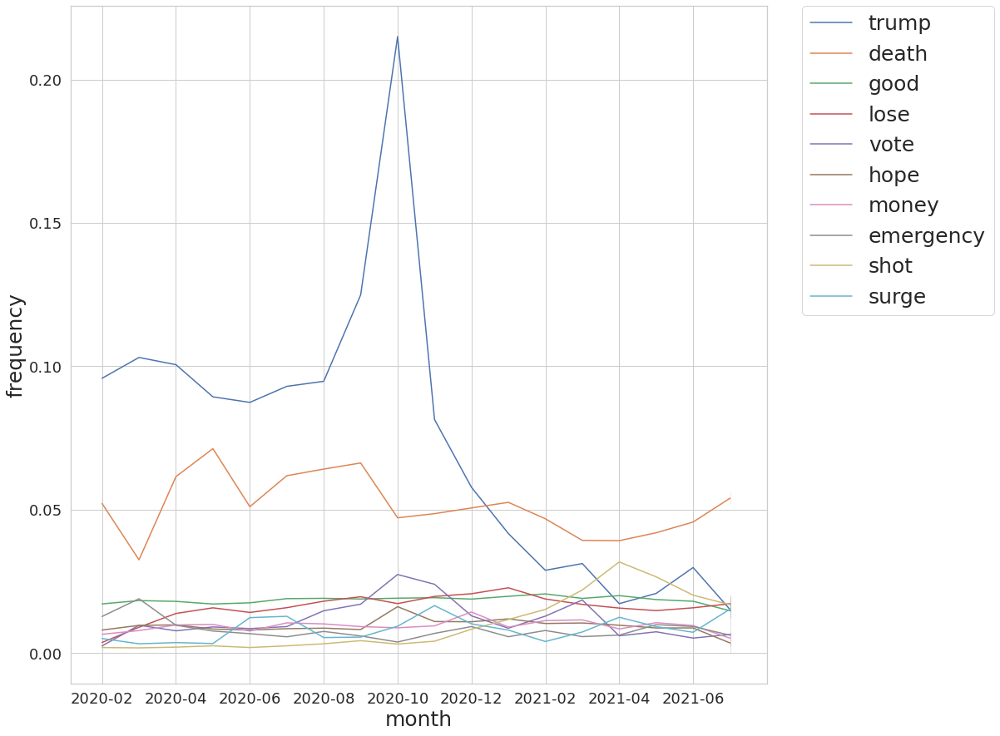

100%|██████████| 10/10 [00:00<00:00, 27.85it/s]


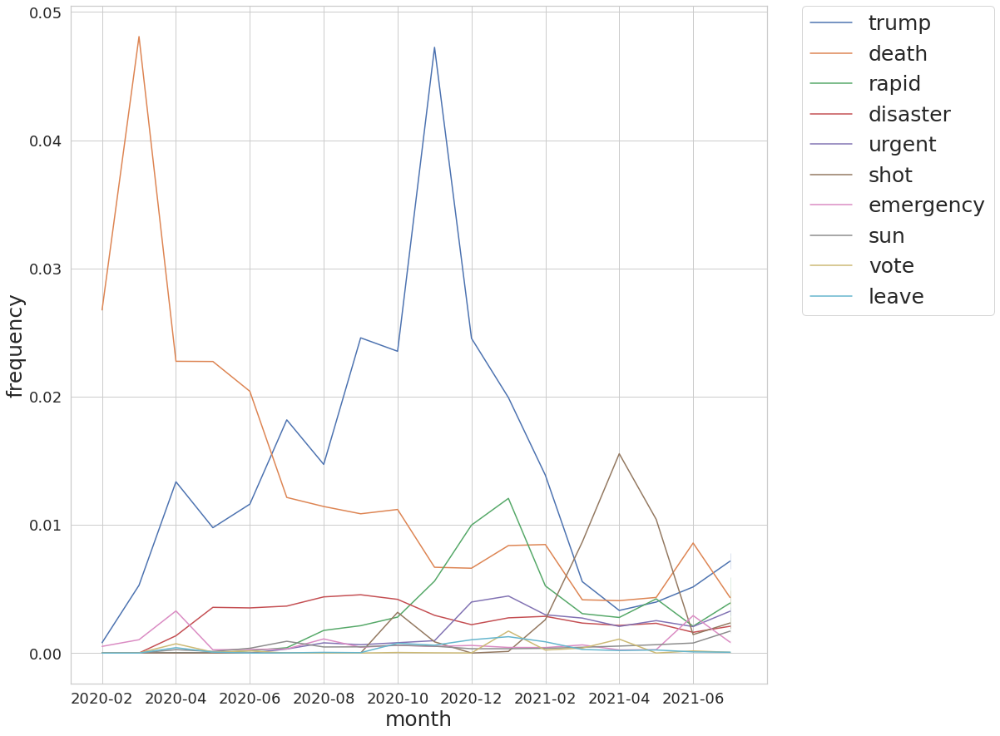

In [142]:
plot_emotion_keywords_monthly_line_chart(tweet_df, tweet_emotion_word_dic,'surprise')
plot_emotion_keywords_monthly_line_chart(bing_df, bing_emotion_word_dic,'surprise')

### sadness

100%|██████████| 10/10 [00:00<00:00, 28.90it/s]


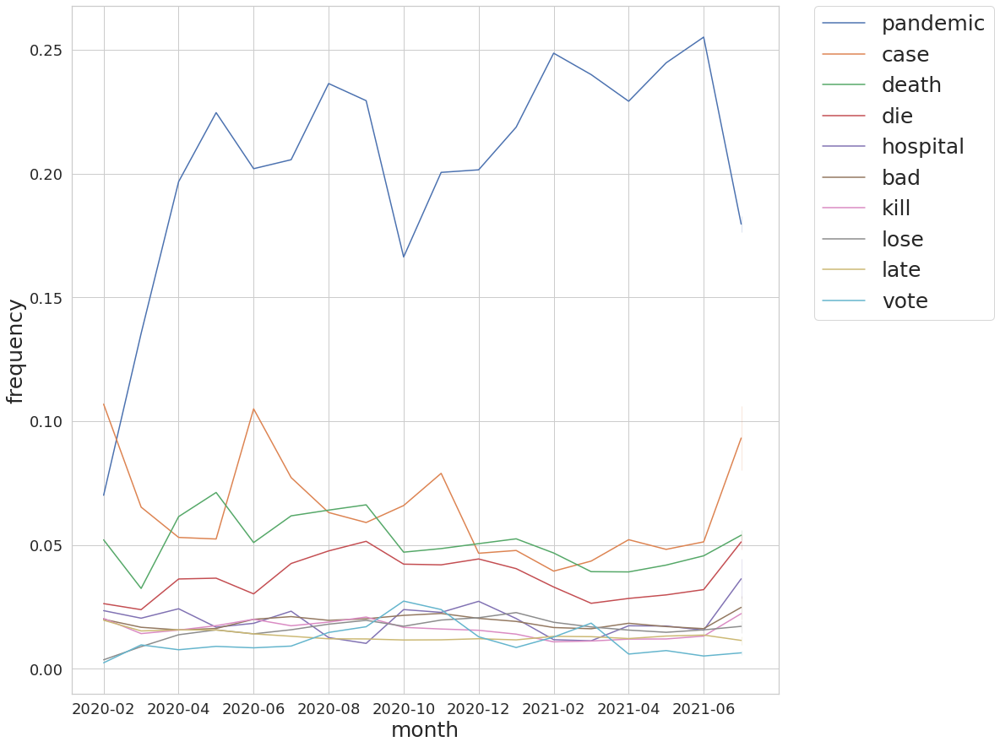

In [210]:
plot_emotion_keywords_monthly_line_chart(tweet_df, tweet_emotion_word_dic,'sadness')

100%|██████████| 10/10 [00:00<00:00, 29.57it/s]


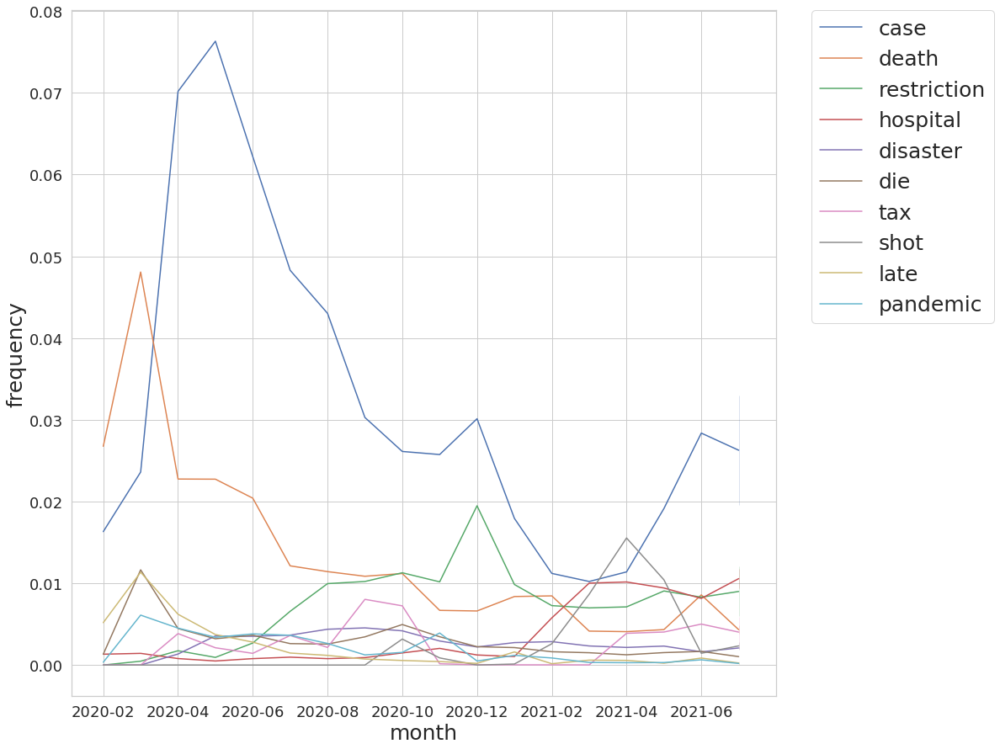

In [211]:
plot_emotion_keywords_monthly_line_chart(bing_df, bing_emotion_word_dic,'sadness')

### fear

100%|██████████| 10/10 [00:00<00:00, 29.07it/s]


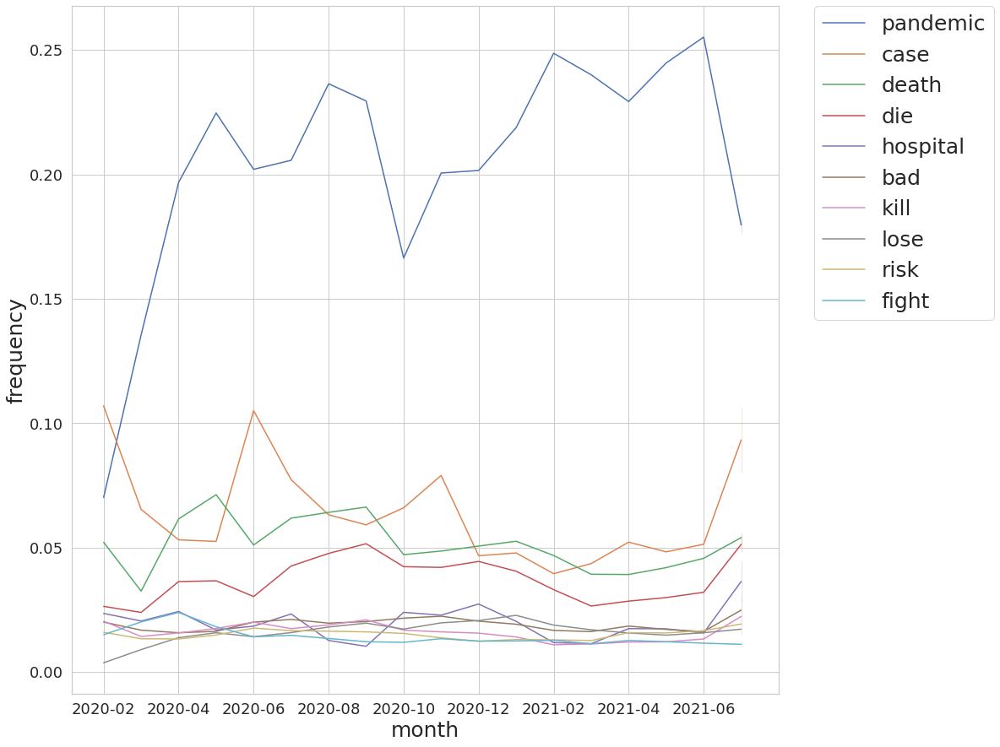

In [212]:
plot_emotion_keywords_monthly_line_chart(tweet_df, tweet_emotion_word_dic,'fear')

100%|██████████| 10/10 [00:00<00:00, 62.78it/s]


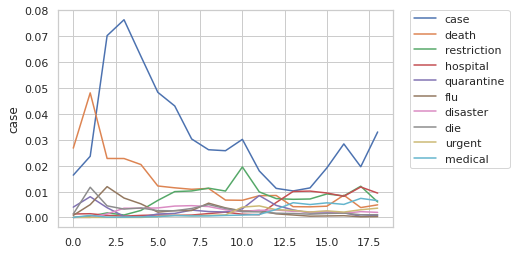

In [40]:
plot_emotion_keywords_monthly_line_chart(bing_df, bing_emotion_word_dic,'fear')

### disgust

100%|██████████| 10/10 [00:00<00:00, 29.34it/s]


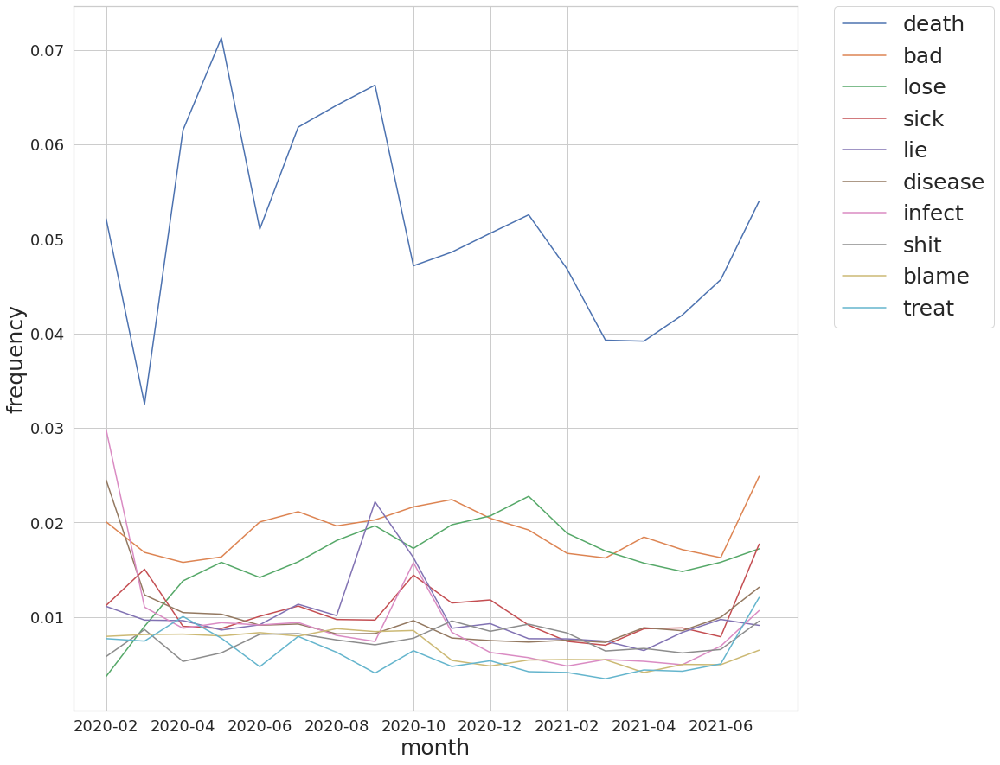

100%|██████████| 10/10 [00:00<00:00, 29.07it/s]


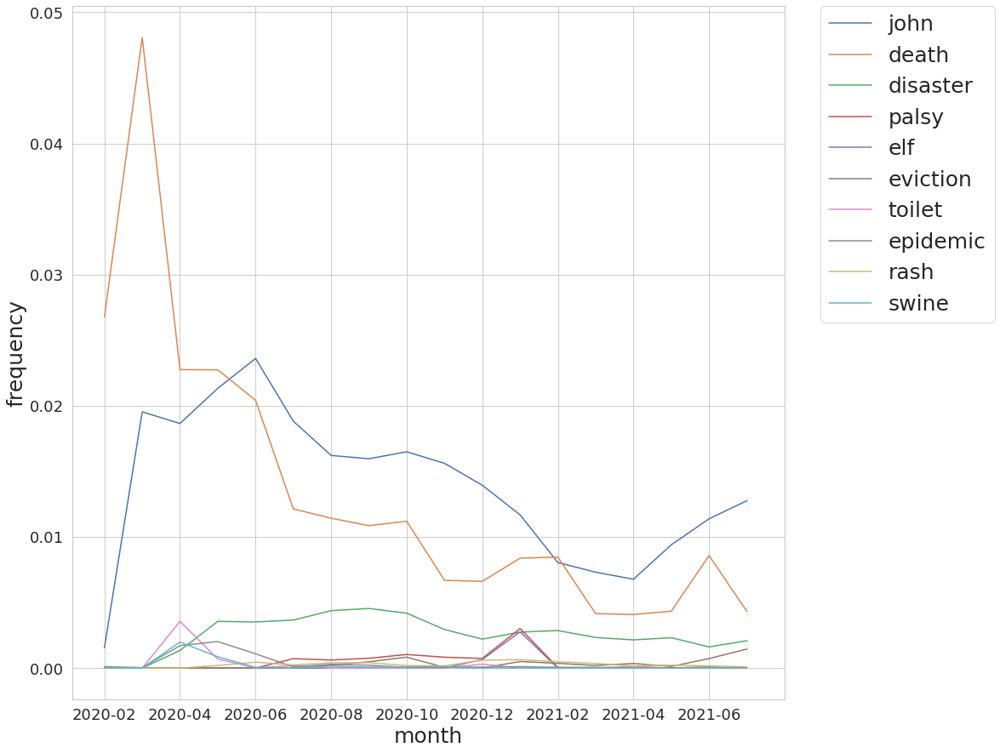

In [213]:
plot_emotion_keywords_monthly_line_chart(tweet_df, tweet_emotion_word_dic,'disgust')
plot_emotion_keywords_monthly_line_chart(bing_df, bing_emotion_word_dic,'disgust')

### anger

100%|██████████| 10/10 [00:00<00:00, 29.04it/s]


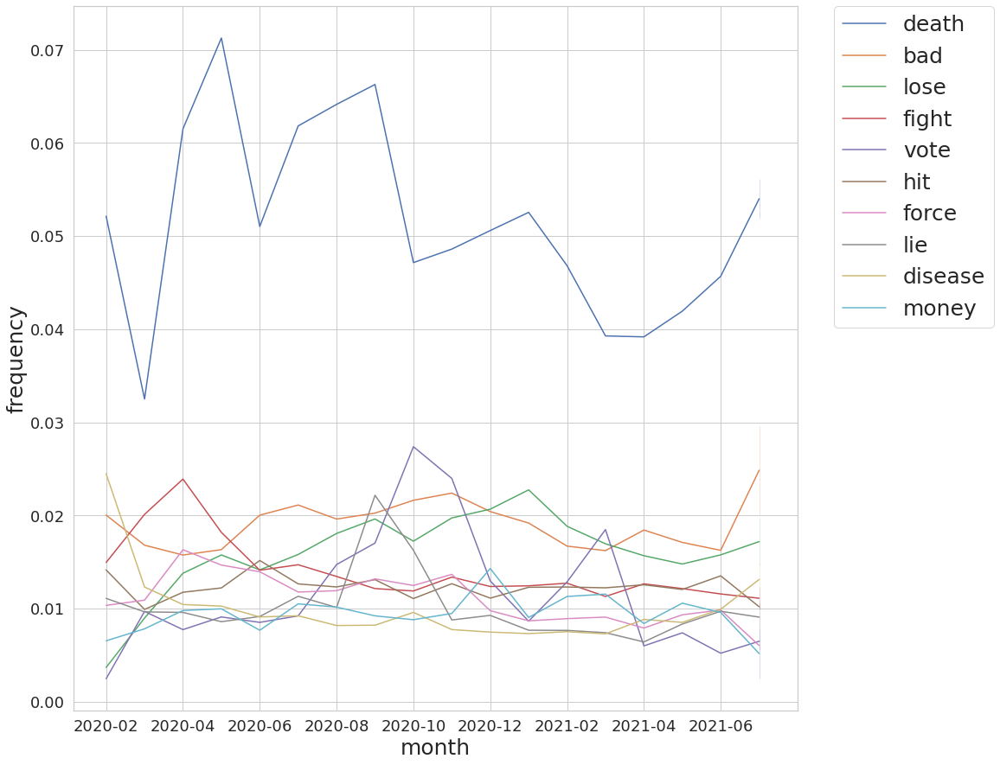

100%|██████████| 10/10 [00:00<00:00, 28.90it/s]


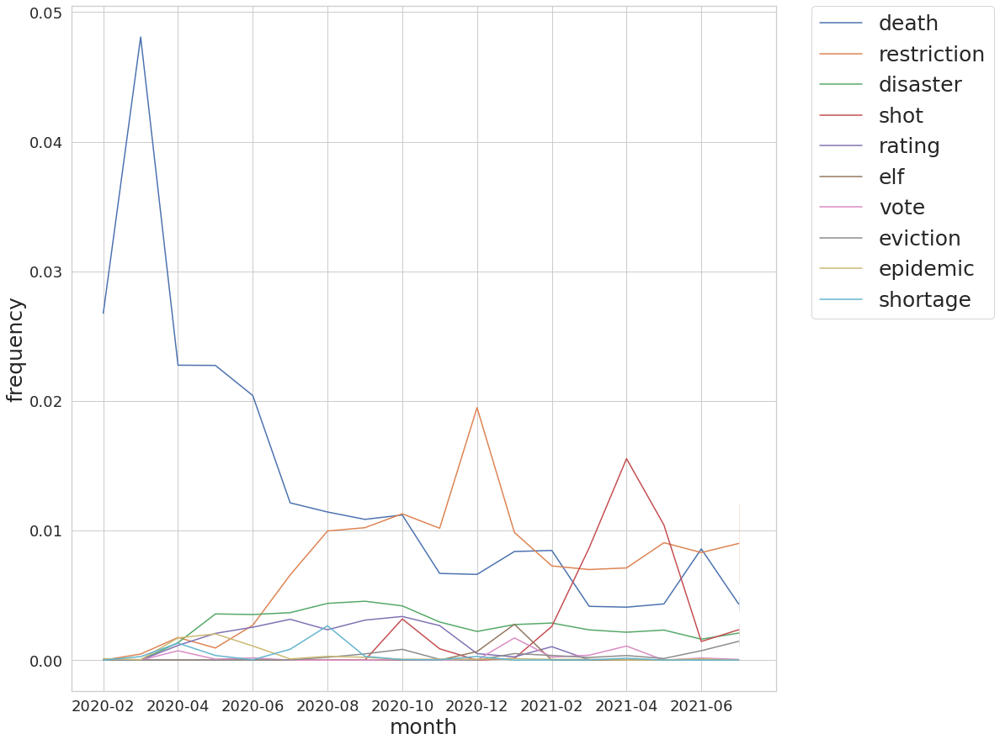

In [214]:
plot_emotion_keywords_monthly_line_chart(tweet_df, tweet_emotion_word_dic,'anger')
plot_emotion_keywords_monthly_line_chart(bing_df, bing_emotion_word_dic,'anger')

### anticip

100%|██████████| 10/10 [00:00<00:00, 28.91it/s]


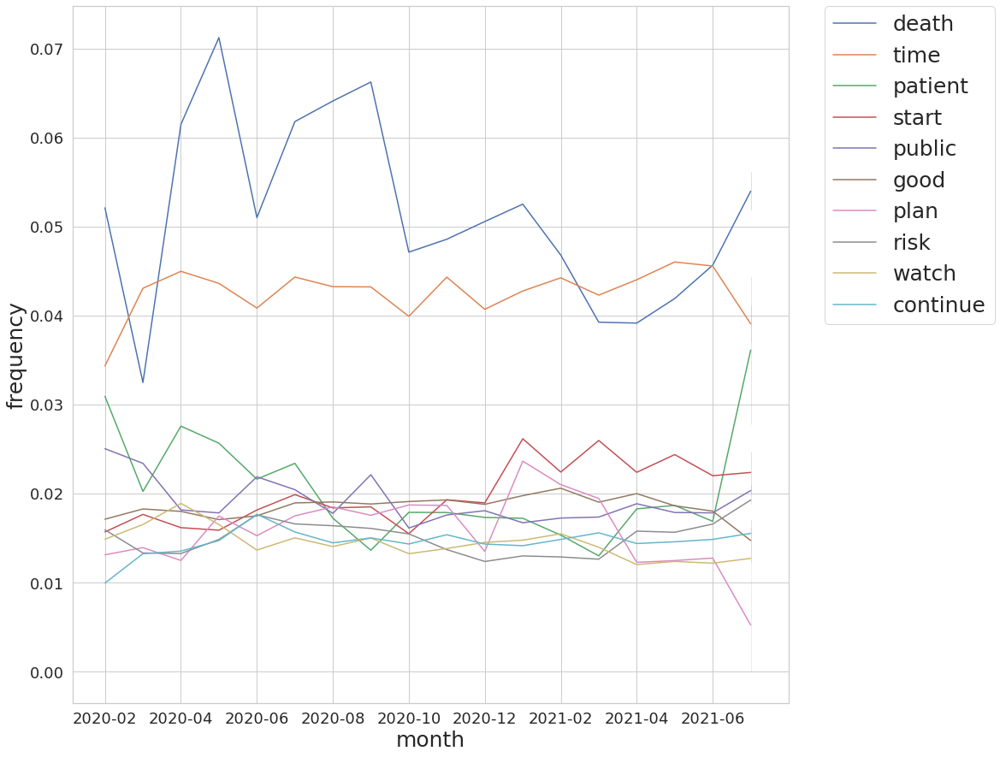

100%|██████████| 10/10 [00:00<00:00, 29.67it/s]


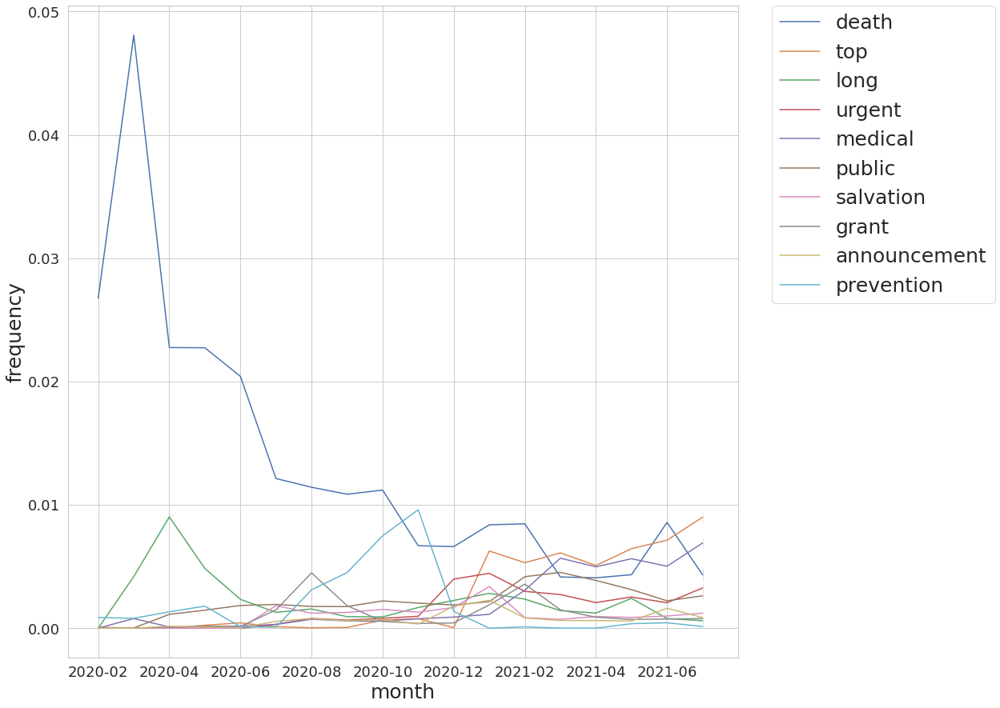

In [215]:
plot_emotion_keywords_monthly_line_chart(tweet_df, tweet_emotion_word_dic,'anticipation')
plot_emotion_keywords_monthly_line_chart(bing_df, bing_emotion_word_dic,'anticipation')

### joy

100%|██████████| 10/10 [00:00<00:00, 29.44it/s]


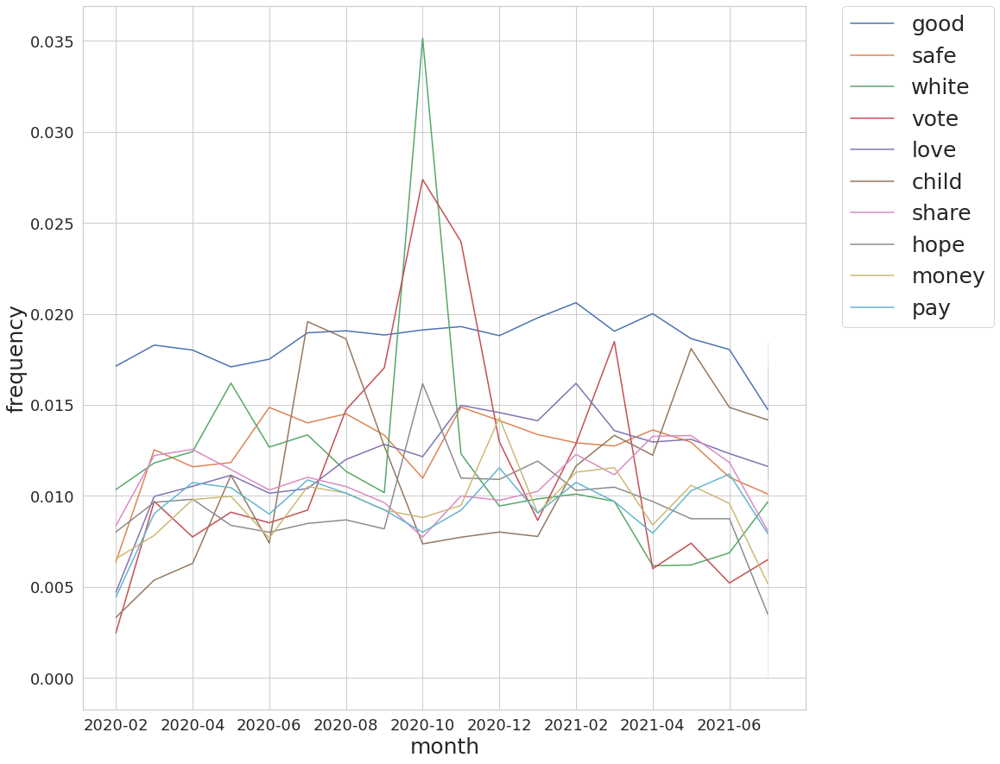

100%|██████████| 10/10 [00:00<00:00, 29.01it/s]


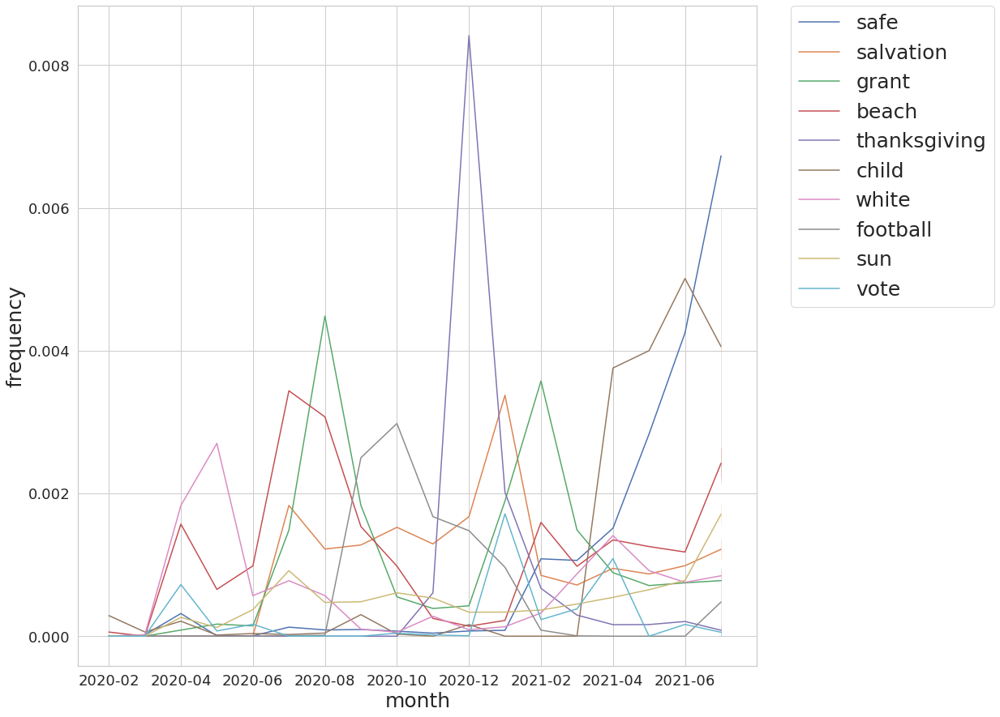

In [216]:
plot_emotion_keywords_monthly_line_chart(tweet_df, tweet_emotion_word_dic,'joy')
plot_emotion_keywords_monthly_line_chart(bing_df, bing_emotion_word_dic,'joy')

### trust

100%|██████████| 10/10 [00:00<00:00, 29.28it/s]


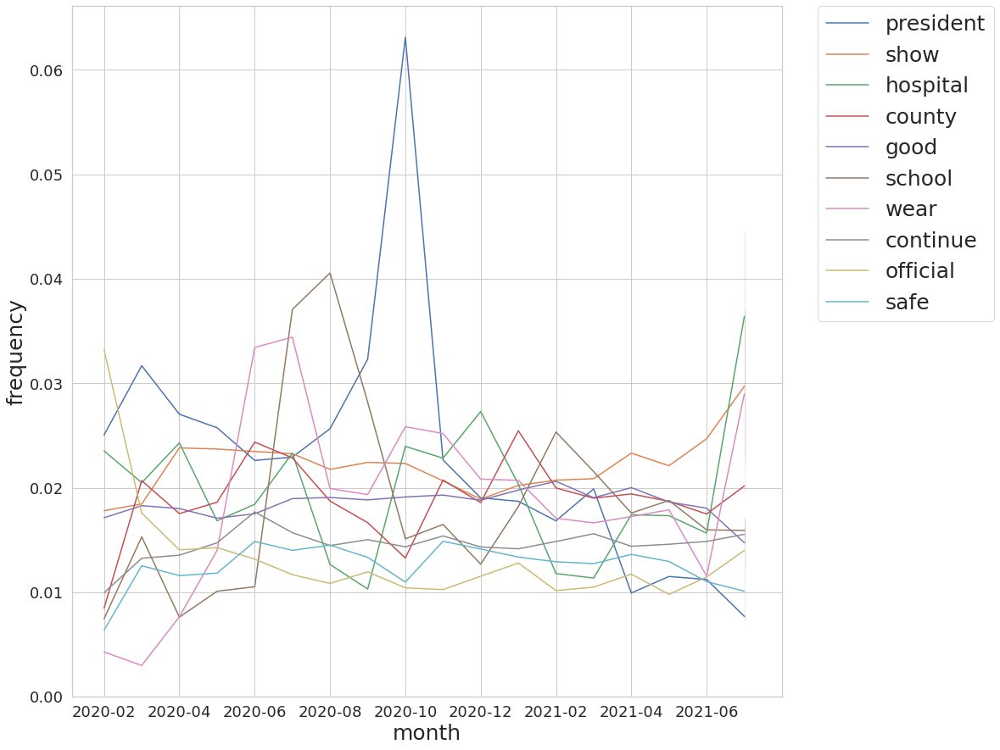

100%|██████████| 10/10 [00:00<00:00, 29.20it/s]


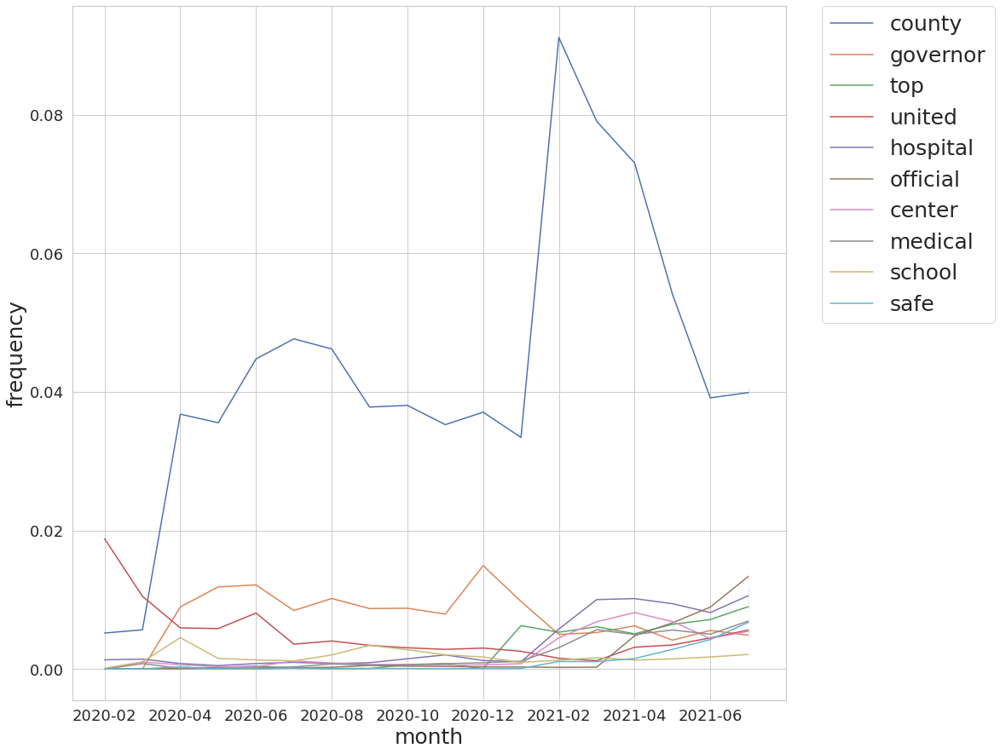

In [181]:
plot_emotion_keywords_monthly_line_chart(tweet_df, tweet_emotion_word_dic,'trust')
plot_emotion_keywords_monthly_line_chart(bing_df, bing_emotion_word_dic,'trust')

In [229]:
bing_most_freq_suprise_words

['trump',
 'death',
 'rapid',
 'disaster',
 'urgent',
 'shot',
 'emergency',
 'sun',
 'vote',
 'leave']

#### keywords related query

In [209]:
bing_df[bing_df['Query'].apply(lambda i: 'election' in i)]

,Unnamed: 0,Date,Query,IsImplicitIntent,State,Country,PopularityScore,date,affect_frequencies,emotion_dic,month,year,fear,anger,joy,sadness,anticipation,surprise,trust,disgust
160328,221065,2020-03-11,election year viruses,True,California,United States,1,2020-03-11,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",{'virus': ['negative']},3,2020,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
280237,472260,2020-03-16,will coronavirus cost trump election,False,Massachusetts,United States,1,2020-03-16,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",{'trump': ['surprise']},3,2020,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1498249,171672,2020-07-10,coronavirus election,False,Washington,United States,1,2020-07-10,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",{},7,2020,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2161493,2293,2020-11-01,us elections 2020,True,North Carolina,United States,2,2020-11-01,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",{},11,2020,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2161612,2765,2020-11-01,us elections 2020,True,Washington,United States,4,2020-11-01,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",{},11,2020,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5150426,152549,2021-07-10,us elections 2020,True,New Jersey,United States,1,2021-07-10,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",{},7,2021,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5157754,159877,2021-07-10,us elections 2020,True,New Jersey,United States,1,2021-07-10,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",{},7,2021,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5168661,170784,2021-07-10,us elections 2020,True,New Jersey,United States,1,2021-07-10,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",{},7,2021,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5200364,202487,2021-07-10,us elections 2020,True,New Jersey,United States,1,2021-07-10,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",{},7,2021,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [68]:
bing_df[bing_df['emotion_dic'].apply(lambda dic: dic.get("john") != None)]

,Unnamed: 0,Date,Query,IsImplicitIntent,State,Country,PopularityScore,date,affect_frequencies,emotion_dic
12279,27704,2020-01-29,john hopkins coronavirus map,False,New York,United States,1,2020-01-29,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...","{'john': ['disgust', 'negative']}"
12303,27745,2020-01-29,johns hopkins coronavirus,False,New York,United States,1,2020-01-29,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...","{'john': ['disgust', 'negative']}"
12405,28015,2020-01-29,johns hopkins coronavirus map,False,Ohio,United States,1,2020-01-29,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...","{'john': ['disgust', 'negative']}"
12812,29055,2020-01-29,john hopkins coronavirus,False,California,United States,1,2020-01-29,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...","{'john': ['disgust', 'negative']}"
12822,29087,2020-01-29,john hopkins coronavirus map,False,California,United States,1,2020-01-29,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...","{'john': ['disgust', 'negative']}"
...,...,...,...,...,...,...,...,...,...,...
5866333,868456,2021-07-31,johns hopkins covid,False,Illinois,United States,9,2021-07-31,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...","{'john': ['disgust', 'negative']}"
5866340,868463,2021-07-31,john hopkins coronavirus tracker,False,New York,United States,2,2021-07-31,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...","{'john': ['disgust', 'negative']}"
5866349,868472,2021-07-31,johns hopkins covid,False,New York,United States,2,2021-07-31,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...","{'john': ['disgust', 'negative']}"
5866359,868482,2021-07-31,john hopkins coronavirus tracker,False,Illinois,United States,6,2021-07-31,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...","{'john': ['disgust', 'negative']}"


In [250]:
bing_df[bing_df['emotion_dic'].apply(lambda dic: dic.get("county") != None)]

,Unnamed: 0,Date,Query,IsImplicitIntent,State,Country,PopularityScore,emotion,emotion_dic,affect_frequencies,...,anger,joy,sadness,anticipation,surprise,trust,disgust,date,month,year
1263,3045,2020-01-21,coronavirus snohomish county,False,Washington,United States,1,<nrclex.NRCLex object at 0x2b9792182e80>,{'county': ['trust']},"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2020-01-21,1,2020
2354,5410,2020-01-23,coronavirus in brazos county,False,Texas,United States,1,<nrclex.NRCLex object at 0x2b97924a9c40>,{'county': ['trust']},"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2020-01-23,1,2020
2387,5472,2020-01-23,coronavirus brazos county,False,Texas,United States,1,<nrclex.NRCLex object at 0x2b97924c5880>,{'county': ['trust']},"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2020-01-23,1,2020
2415,5540,2020-01-23,corona virus brazos county,False,Texas,United States,1,<nrclex.NRCLex object at 0x2b97924e0100>,"{'virus': ['negative'], 'county': ['trust']}","{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",...,0.0,0.0,0.0,0.0,0.0,0.5,0.0,2020-01-23,1,2020
2469,5651,2020-01-23,brazos county coronavirus,False,Texas,United States,1,<nrclex.NRCLex object at 0x2b97924fdf70>,{'county': ['trust']},"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2020-01-23,1,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5866571,868694,2021-07-31,el dorado county,True,California,United States,1,<nrclex.NRCLex object at 0x2b9c1a29c070>,{'county': ['trust']},"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2021-07-31,7,2021
5866654,868777,2021-07-31,brevard county,True,Florida,United States,2,<nrclex.NRCLex object at 0x2b9c1a2d5100>,{'county': ['trust']},"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2021-07-31,7,2021
5866708,868831,2021-07-31,catawba county,True,North Carolina,United States,3,<nrclex.NRCLex object at 0x2b9c1a2fefd0>,{'county': ['trust']},"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2021-07-31,7,2021
5866775,868898,2021-07-31,charlotte county,True,Florida,United States,2,<nrclex.NRCLex object at 0x2b9c1a335850>,{'county': ['trust']},"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2021-07-31,7,2021


In [53]:
bing_df1 = bing_df[bing_df['emotion_dic'].apply(lambda dic: dic.get("county") != None)].copy()

In [56]:
bing_df2 = bing_df1[(bing_df1['date'] >= '2021-02-01') & (bing_df1['date'] < '2021-04-01') ]

In [200]:
bing_df3 = bing_df1[(bing_df1['date'] >= '2021-02-01') & (bing_df1['date'] < '2021-03-01') ]

In [201]:
bing_df3['tokens'] = bing_df3.Query.str.split(" ")
bing_lst = [g for i in bing_df3["tokens"] for g in i]

<ipython-input-201-a36a9027d1a0>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bing_df3['tokens'] = bing_df3.Query.str.split(" ")


/sw/arcts/centos7/python3.8-anaconda/2021.05/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

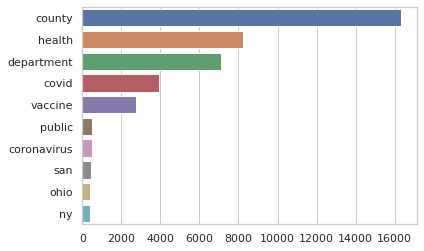

In [202]:
words = [i[0] for i in Counter(bing_lst).most_common(10)]
counts = [i[1] for i in Counter(bing_lst).most_common(10)]
import seaborn as sns
sns.barplot(counts, words)

In [57]:
bing_df2['tokens'] = bing_df2.Query.str.split(" ")

<ipython-input-57-def820144e3d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bing_df2['tokens'] = bing_df2.Query.str.split(" ")


In [60]:
bing_lst = [g for i in bing_df2["tokens"] for g in i]

In [62]:
Counter(bing_lst).most_common(10)

[('county', 34483),
 ('health', 16701),
 ('department', 14470),
 ('covid', 8068),
 ('vaccine', 6262),
 ('public', 1018),
 ('coronavirus', 1018),
 ('san', 921),
 ('ohio', 915),
 ('ny', 774)]

/sw/arcts/centos7/python3.8-anaconda/2021.05/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

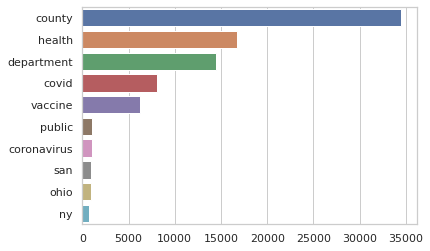

In [67]:
words = [i[0] for i in Counter(bing_lst).most_common(10)]
counts = [i[1] for i in Counter(bing_lst).most_common(10)]
import seaborn as sns
sns.barplot(counts, words)

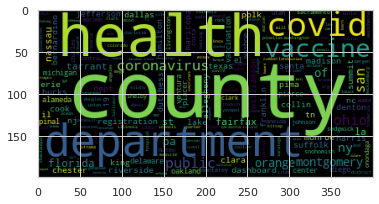

In [66]:
word_could_dict=Counter(bing_lst)
wordcloud = WordCloud().generate_from_frequencies(word_could_dict)
plt.imshow(wordcloud)

In [ ]:
plot_emotion_word_cloud(suprise_word_dic, "tweet_emotion_word_cloud.pdf")

In [ ]:
# suprise_word_dic = {}
# for i in range(len(date_list) - 1):
#     start = date_list[i]
#     end = date_list[i + 1]
#     lst = get_emtion_word_freq_by_month(bing_df, start, end, 'surprise', 10)
#     suprise_word_dic[start] = lst

# plot_emotion_word_cloud(suprise_word_dic, "tweet_emotion_word_cloud.pdf")

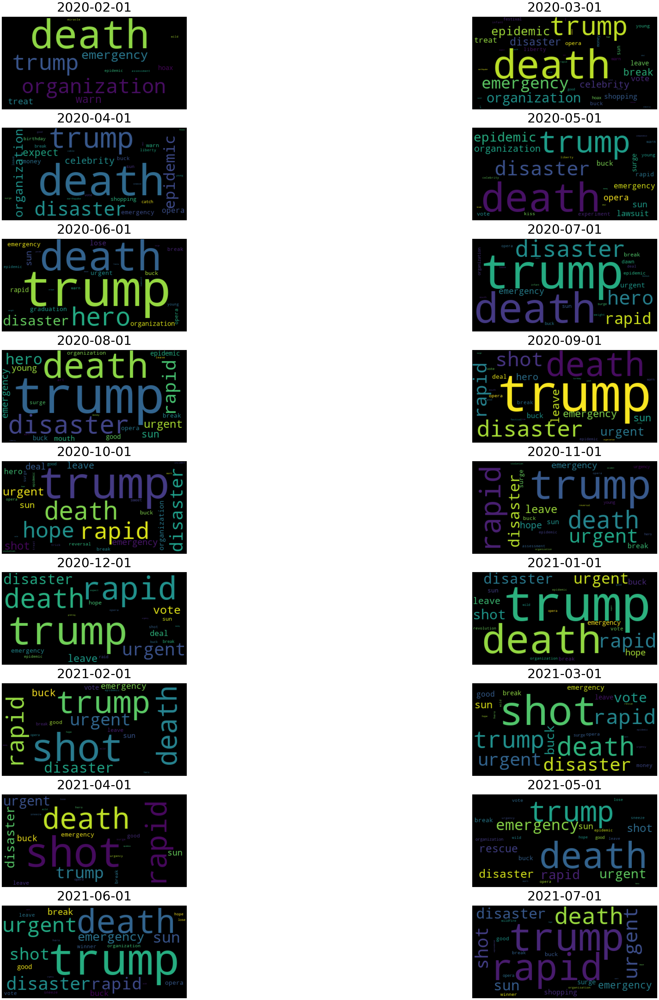

In [121]:
suprise_word_dic = {}
for i in range(len(date_list) - 1):
    start = date_list[i]
    end = date_list[i + 1]
    lst = get_emtion_word_freq_by_month(bing_df, start, end, 'surprise', 10)
    suprise_word_dic[start] = lst

plot_emotion_word_cloud(suprise_word_dic, "tweet_emotion_word_cloud.pdf")

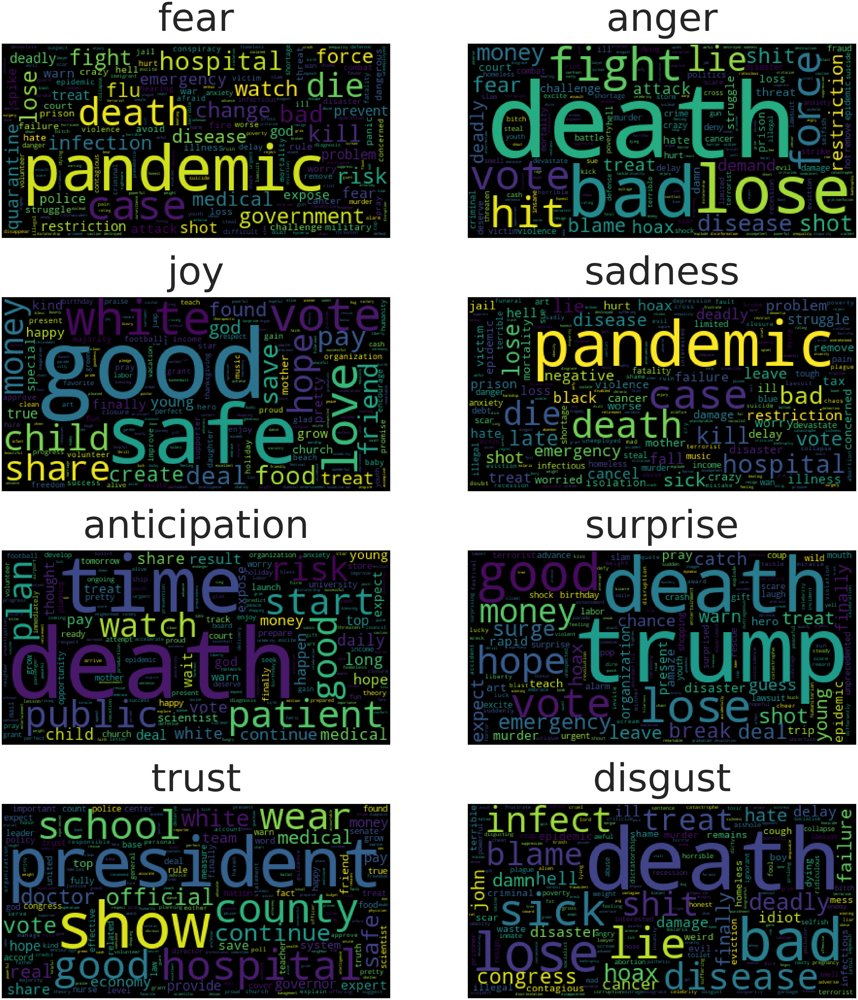

In [636]:
plot_emotion_word_cloud(tweet_emotion_word_dic, "tweet_emotion_word_cloud.pdf")

### Monthly

phase 1: 02/2020 - 08/2020
phase 2: 09/2020 - 02/2021
phase 3: 03/2021 - 07/2021

In [637]:
tweet_df1 = tweet_df[tweet_df["date"] < "2020-09-01"].copy()
tweet_df2 = tweet_df[(tweet_df["date"] < "2021-03-01" )
                     & (tweet_df["date"] >= "2020-09-01")].copy()
tweet_df3 = tweet_df[tweet_df["date"] >= "2021-03-01"].copy()

100%|██████████| 796105/796105 [00:01<00:00, 451199.01it/s]


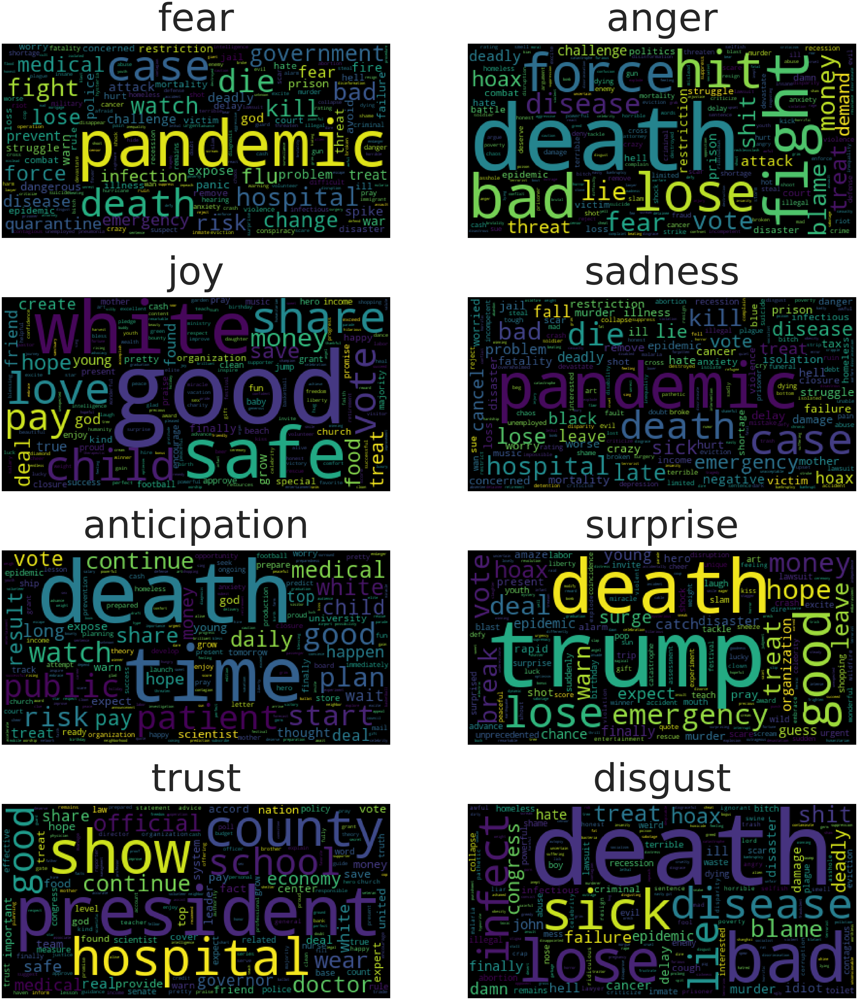

In [654]:
tweet_emotion_word_dic1 = get_emotion_word_dic(tweet_df1)
plot_emotion_word_cloud(tweet_emotion_word_dic1, "tweet_emotion_word_cloud_phase1.pdf")

100%|██████████| 619779/619779 [00:01<00:00, 457417.65it/s]


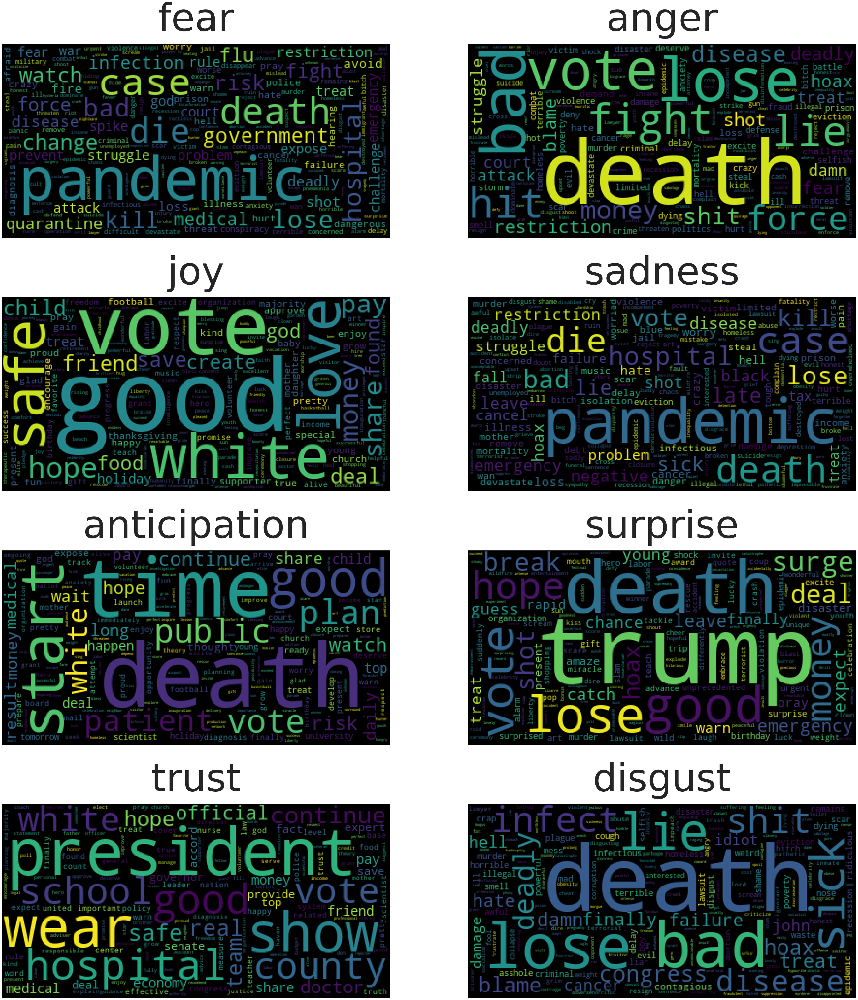

In [655]:
tweet_emotion_word_dic2 = get_emotion_word_dic(tweet_df2)
plot_emotion_word_cloud(tweet_emotion_word_dic2, "tweet_emotion_word_cloud_phase1.pdf")

100%|██████████| 394410/394410 [00:01<00:00, 279453.19it/s]


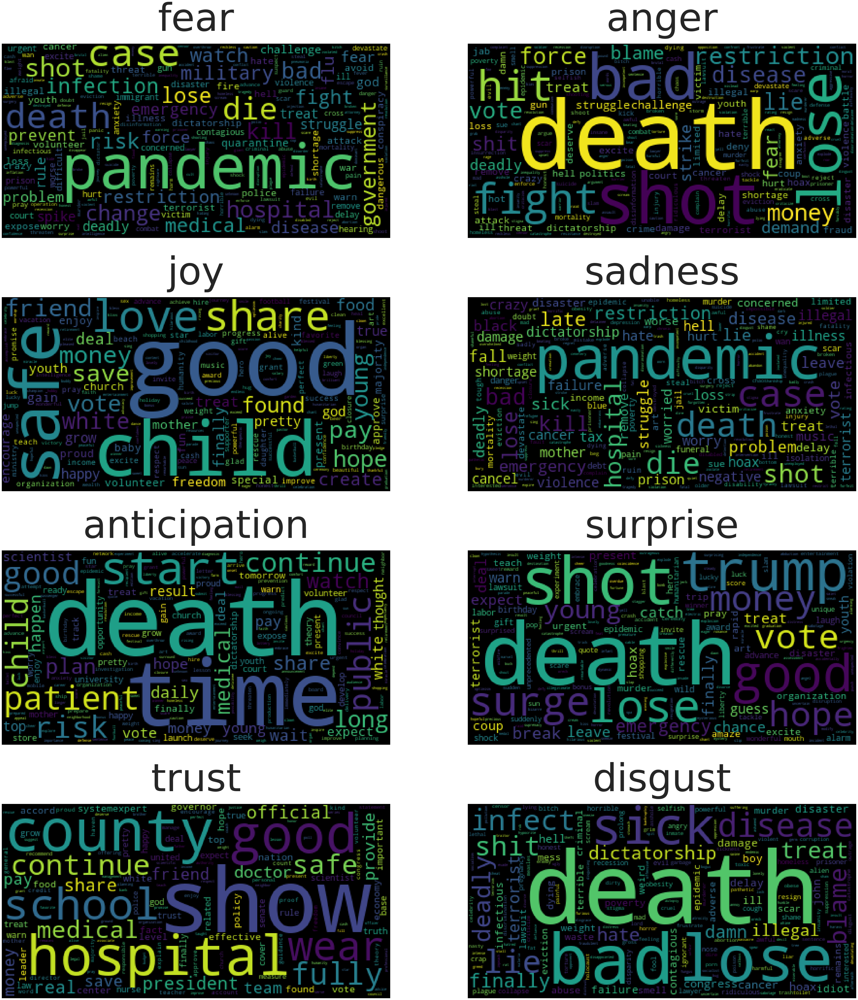

In [656]:
tweet_emotion_word_dic3 = get_emotion_word_dic(tweet_df3)
plot_emotion_word_cloud(tweet_emotion_word_dic3, "tweet_emotion_word_cloud_phase3.pdf")

In [662]:
get_emotion_df_from_dic(tweet_emotion_word_dic,"tweet_emotion_word_count_all.csv", 3)
get_emotion_df_from_dic(tweet_emotion_word_dic1,"tweet_emotion_word_count_phase1.csv", 3)
get_emotion_df_from_dic(tweet_emotion_word_dic2,"tweet_emotion_word_count_phase2.csv", 3)
get_emotion_df_from_dic(tweet_emotion_word_dic3,"tweet_emotion_word_count_phase3.csv", 3)

100%|██████████| 8/8 [00:00<00:00, 14.47it/s]


,word,occurence,frequence,emotion_type
0,pandemic,87291,0.196345,fear
1,case,22880,0.051464,fear
2,death,17931,0.040333,fear
3,death,17931,0.040333,anger
4,shot,9285,0.020885,anger
5,bad,7096,0.015961,anger
6,good,7290,0.016398,joy
7,child,6140,0.013811,joy
8,safe,5034,0.011323,joy
9,pandemic,87291,0.196345,sadness


# line chart

In [178]:
def plot_monthly_emotion_freq(df, filename = None):
    df['label'] = month_list
    df = df.set_index('label')
    
    time_format = "%m%y"
#     fear = df.groupby(df.date.dt.strftime(time_format)).fear.mean()
#     anger = df.groupby(df.date.dt.strftime(time_format)).anger.mean()
#     joy = df.groupby(df.date.dt.strftime(time_format)).joy.mean()
#     sadness = df.groupby(df.date.dt.strftime(time_format)).sadness.mean()
#     anticip = df.groupby(df.date.dt.strftime(time_format)).anticip.mean()
#     surprise = df.groupby(df.date.dt.strftime(time_format)).surprise.mean()
#     trust = df.groupby(df.date.dt.strftime(time_format)).trust.mean()
#     disgust = df.groupby(df.date.dt.strftime(time_format)).disgust.mean()
    
    fig, ax = plt.subplots(figsize=(15,15))


    
    sns.set(font_scale=1)
    sns.set_style("whitegrid")
    sns.lineplot(data=df["fear"],label='fear')
    sns.lineplot(data=df["anger"],label = 'anger')
    sns.lineplot(data=df["joy"],label = 'joy')
    sns.lineplot(data=df["sadness"],label = 'sadness')
    sns.lineplot(data=df["anticipation"],label = 'anticipation')
    sns.lineplot(data=df["surprise"],label = 'surprise')
    sns.lineplot(data=df["trust"],label = 'trust')
    sns.lineplot(data=df["disgust"],label = 'disgust')

    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=25)
    plt.xlabel('month', fontsize=25)
    plt.ylabel('frequency', fontsize=25)
    
    ax.set_xticks(np.arange(0, df.shape[0], step=2))   
    plt.xticks(fontsize = 18)
    plt.yticks(fontsize = 18)
    if filename != None:
        plt.savefig(base_url + "/emotion/" + filename)    

In [168]:
tweet_df['anticipation'] = tweet_df['anticip'] 

In [166]:
def summarize_montly_data(df):
    df["month"] = df["date"].dt.month
    df["year"] = df["date"].dt.year
    montly_df = df.groupby(["year", "month"])[["fear", "anger", "joy", "sadness", "anticipation", "surprise", "trust", "disgust"]].mean()
    montly_df = montly_df.reset_index()
    return montly_df

In [170]:
summarize_montly_data(tweet_df)

,year,month,fear,anger,joy,sadness,anticipation,surprise,trust,disgust
0,2020,2,0.128778,0.051672,0.027554,0.084748,0.0,0.050793,0.103957,0.036369
1,2020,3,0.110162,0.045962,0.037265,0.082865,0.0,0.050002,0.117049,0.032404
2,2020,4,0.117879,0.050187,0.038521,0.090056,0.0,0.048310,0.116799,0.032632
3,2020,5,0.121094,0.051038,0.038032,0.094266,0.0,0.046452,0.114095,0.033064
4,2020,6,0.124638,0.048779,0.035810,0.098149,0.0,0.047691,0.110984,0.031647
5,2020,7,0.117372,0.049757,0.037702,0.096782,0.0,0.048013,0.117080,0.034870
6,2020,8,0.119544,0.048439,0.039055,0.099717,0.0,0.047870,0.113731,0.033549
7,2020,9,0.120665,0.050536,0.037913,0.098980,0.0,0.052927,0.109253,0.034084
8,2020,10,0.108756,0.047547,0.038819,0.088343,0.0,0.078273,0.113249,0.035023
9,2020,11,0.114867,0.047954,0.043120,0.094326,0.0,0.049345,0.111814,0.032050


In [169]:
summarize_montly_data(bing_df)

,year,month,fear,anger,joy,sadness,anticipation,surprise,trust,disgust
0,2020,1,0.020674,0.004358,0.002243,0.013553,0.0,0.005219,0.015534,0.006653
1,2020,2,0.034727,0.011106,0.005978,0.029383,0.0,0.013054,0.015730,0.017336
2,2020,3,0.044603,0.007848,0.004403,0.039975,0.0,0.017039,0.062317,0.016586
3,2020,4,0.036575,0.006284,0.002996,0.036323,0.0,0.011856,0.058726,0.015788
4,2020,5,0.031211,0.005737,0.002208,0.030374,0.0,0.012915,0.066102,0.016145
5,2020,6,0.028426,0.006770,0.006411,0.026872,0.0,0.018567,0.062966,0.013188
6,2020,7,0.026252,0.007237,0.006123,0.024987,0.0,0.017807,0.066517,0.011161
7,2020,8,0.022761,0.006652,0.004868,0.021559,0.0,0.025043,0.056535,0.011201
8,2020,9,0.022477,0.007253,0.003373,0.021158,0.0,0.025069,0.055490,0.011285
9,2020,10,0.020594,0.005586,0.003605,0.017260,0.0,0.049931,0.055178,0.009822


# BING

In [33]:
bing_df = pd.read_csv(base_url + "/final_data/" + "US_Bing_data.csv", lineterminator="\n")
bing_df = bing_df[bing_df["Date"].apply(len)==10]
bing_df['date']=pd.to_datetime(bing_df.Date) 
bing_df.head()

,Unnamed: 0,Date,Query,IsImplicitIntent,State,Country,PopularityScore,date
0,0,2020-01-01,coronavirus,False,Michigan,United States,1,2020-01-01
1,1,2020-01-01,coronavirus,False,Pennsylvania,United States,1,2020-01-01
2,5,2020-01-02,coronavirus,False,California,United States,67,2020-01-02
3,7,2020-01-02,coronavirus,False,Ohio,United States,1,2020-01-02
4,8,2020-01-02,corona virus,False,California,United States,100,2020-01-02


In [171]:
# bing_df['emotion']  = bing_df['Query'].apply(detect_emotion)
# bing_df['emotion_dict']  = bing_df['emotion'].apply(lambda emo_dict: emo_dict.affect_dict)

In [25]:
bing_df.head()

,Unnamed: 0,Date,Query,IsImplicitIntent,State,Country,PopularityScore
0,0,2020-01-01,coronavirus,False,Michigan,United States,1
1,1,2020-01-01,coronavirus,False,Pennsylvania,United States,1
2,5,2020-01-02,coronavirus,False,California,United States,67
3,7,2020-01-02,coronavirus,False,Ohio,United States,1
4,8,2020-01-02,corona virus,False,California,United States,100


In [468]:
# bing_df0 = bing_df[["Date", "Query","IsImplicitIntent","State","Country","PopularityScore","emotion"]].copy()

In [157]:
# add_emotion_to_df(bing_df,"Query")
# add_emotion_attr_to_df(bing_df)
# bing_emotion_word_dic = get_emotion_word_dic(bing_df)

In [251]:
#   with open(base_url + '/emotion/bing_affect_frequencies.json', 'w') as fp:
#     json.dump(bing_df["affect_frequencies"].tolist(), fp)

# with open(base_url + '/emotion/bing_emotion_dic.json', 'w') as fp:
#     json.dump(bing_df["emotion_dic"].tolist(), fp)
    
# with open(base_url + '/emotion/bing_emotion_word_dic.json', 'w') as fp:
#     json.dump(bing_emotion_word_dic, fp)

In [35]:
with open(base_url + '/emotion/bing_affect_frequencies.json', 'r') as fp:
    bing_affect_frequencies = json.load(fp)

with open(base_url + '/emotion/bing_emotion_dic.json', 'r') as fp:
    bing_emotion_dic = json.load(fp)
    
with open(base_url + '/emotion/bing_emotion_word_dic.json', 'r') as fp:
    bing_emotion_word_dic = json.load(fp)

In [36]:
bing_df['affect_frequencies'] = bing_affect_frequencies
bing_df['emotion_dic'] = bing_emotion_dic
bing_df.head()

,Unnamed: 0,Date,Query,IsImplicitIntent,State,Country,PopularityScore,date,affect_frequencies,emotion_dic
0,0,2020-01-01,coronavirus,False,Michigan,United States,1,2020-01-01,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",{}
1,1,2020-01-01,coronavirus,False,Pennsylvania,United States,1,2020-01-01,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",{}
2,5,2020-01-02,coronavirus,False,California,United States,67,2020-01-02,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",{}
3,7,2020-01-02,coronavirus,False,Ohio,United States,1,2020-01-02,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",{}
4,8,2020-01-02,corona virus,False,California,United States,100,2020-01-02,"{'fear': 0.0, 'anger': 0.0, 'anticip': 0.0, 't...",{'virus': ['negative']}


## word cloud

100%|██████████| 5866935/5866935 [00:06<00:00, 891781.76it/s] 


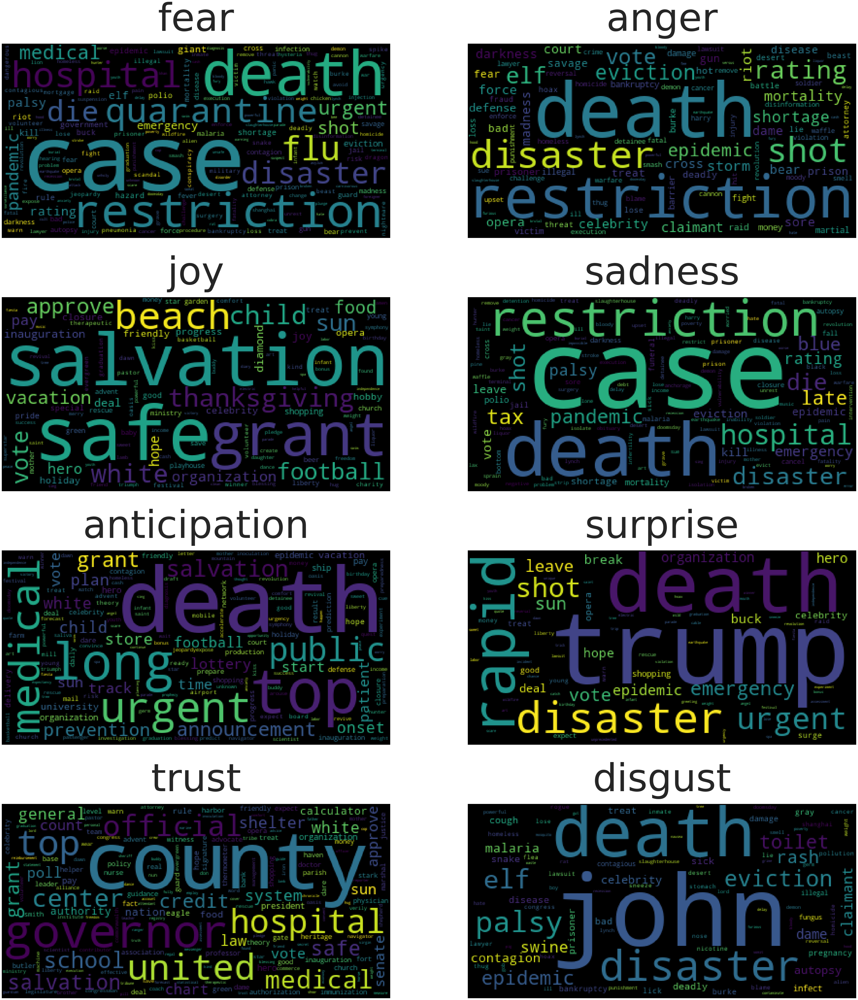

In [642]:
bing_emotion_word_dic = get_emotion_word_dic(bing_df)
plot_emotion_word_cloud(bing_emotion_word_dic, "bing_emotion_word_cloud.pdf")

In [203]:
def plot_emotion_daily_freq(df):
    time_format = "%m/%d"
    fear = df.groupby(df.date.dt.strftime(time_format)).fear.mean()
    anger = df.groupby(df.date.dt.strftime(time_format)).anger.mean()
    joy = df.groupby(df.date.dt.strftime(time_format)).joy.mean()
    sadness = df.groupby(df.date.dt.strftime(time_format)).sadness.mean()
    anticip = df.groupby(df.date.dt.strftime(time_format)).anticip.mean()
    surprise = df.groupby(df.date.dt.strftime(time_format)).surprise.mean()
    trust = df.groupby(df.date.dt.strftime(time_format)).trust.mean()
    disgust = df.groupby(df.date.dt.strftime(time_format)).disgust.mean()
    sns.lineplot(data=fear,label='fear')
    sns.lineplot(data=anger,label = 'anger')
    sns.lineplot(data=joy,label = 'joy')
    sns.lineplot(data=sadness,label = 'sadness')
    sns.lineplot(data=anticip,label = 'anticipation')
    sns.lineplot(data=surprise,label = 'surprise')
    sns.lineplot(data=trust,label = 'trust')
    sns.lineplot(data=disgust,label = 'disgust')

100%|██████████| 1854474/1854474 [00:01<00:00, 1159410.16it/s]


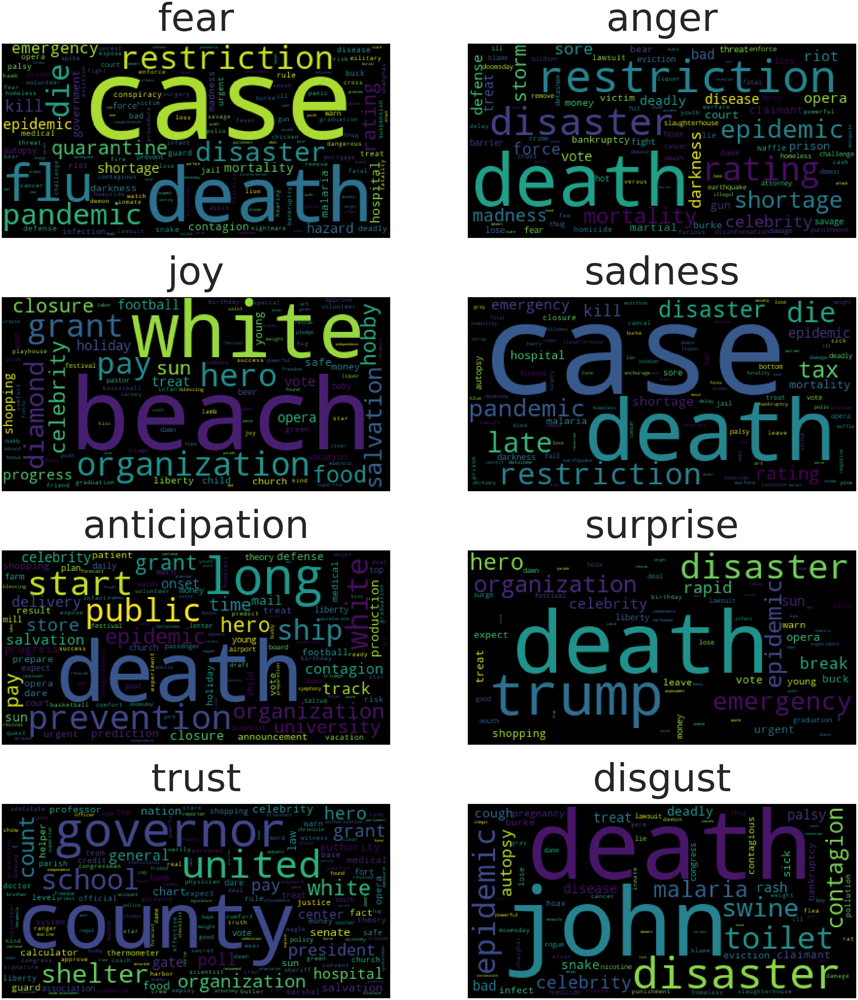

In [644]:
bing_emotion_word_dic1 = get_emotion_word_dic(bing_df1)
plot_emotion_word_cloud(bing_emotion_word_dic1, "bing_emotion_word_cloud2.pdf")

100%|██████████| 1014189/1014189 [00:00<00:00, 1215887.30it/s]


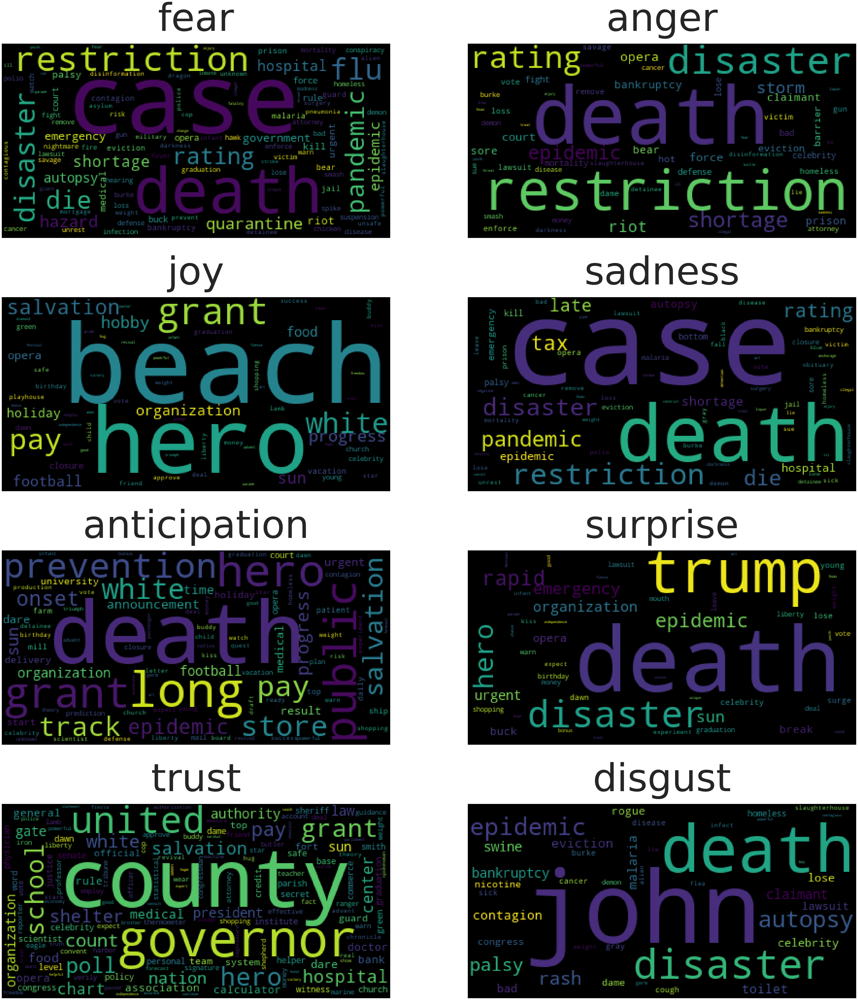

In [645]:
bing_emotion_word_dic2 = get_emotion_word_dic(bing_df2)
plot_emotion_word_cloud(bing_emotion_word_dic2, "bing_emotion_word_cloud2.pdf")

100%|██████████| 1536398/1536398 [00:01<00:00, 1215931.86it/s]


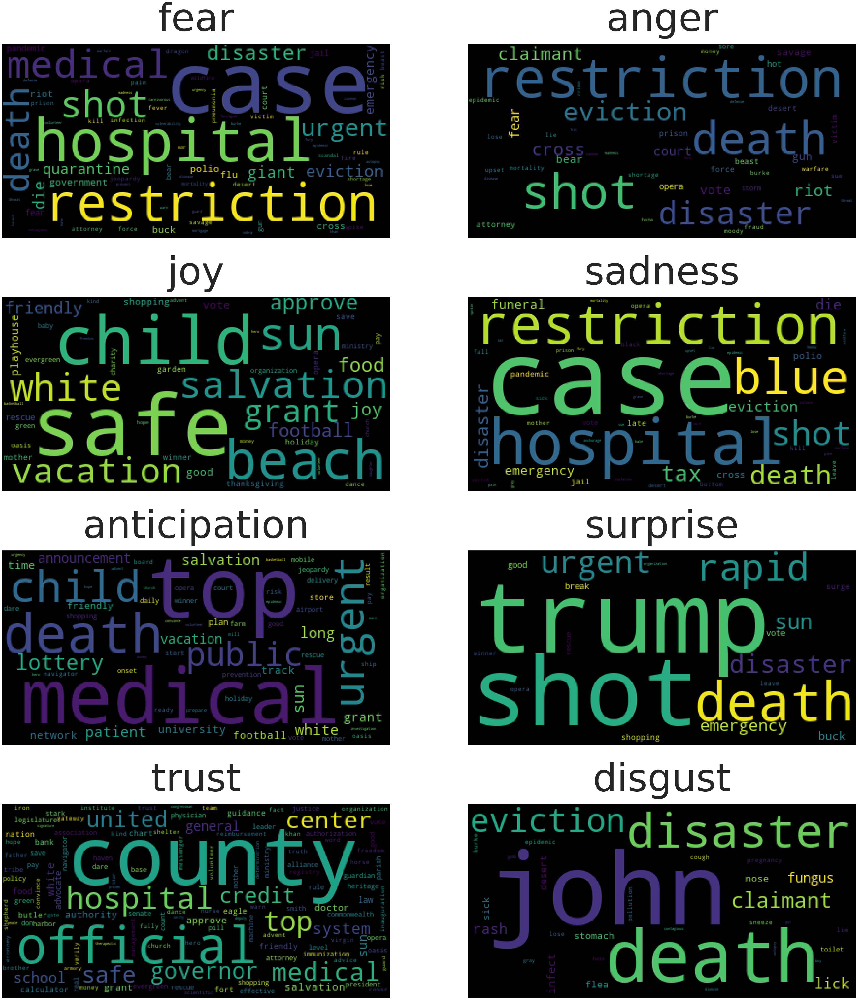

In [646]:
bing_emotion_word_dic3 = get_emotion_word_dic(bing_df3)
plot_emotion_word_cloud(bing_emotion_word_dic3, "bing_emotion_word_dic3.pdf")

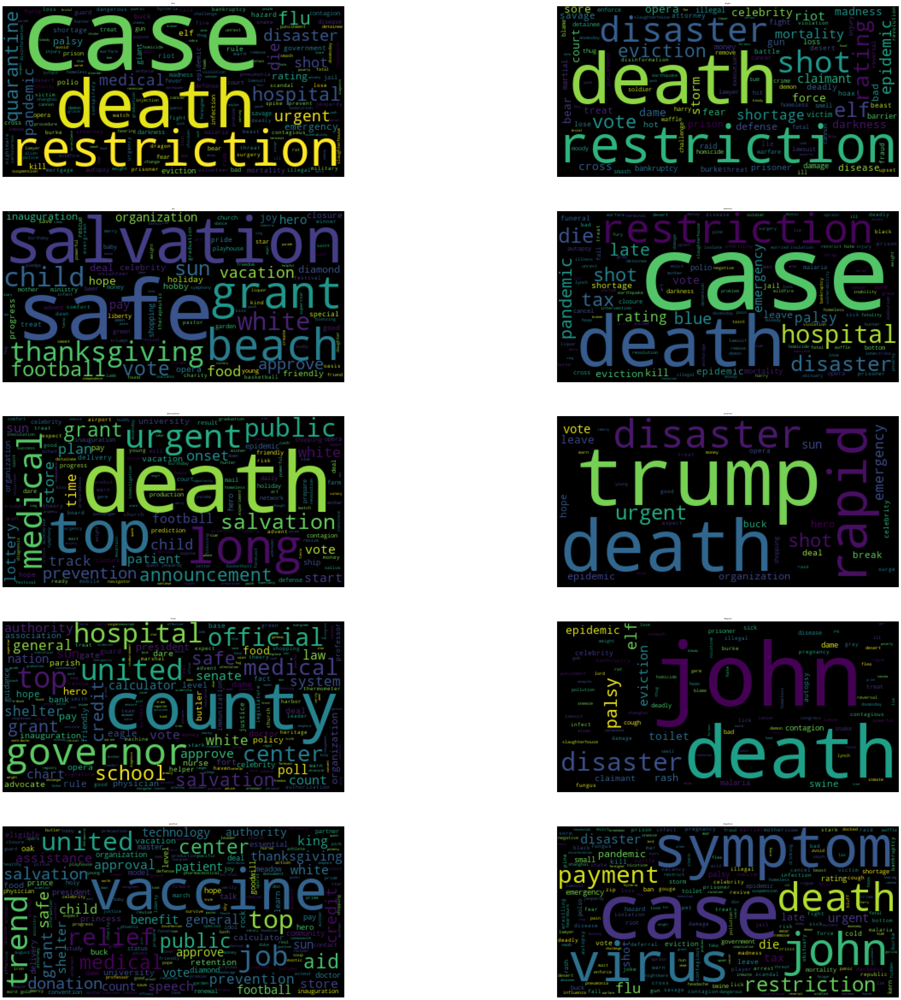

In [425]:
# with open(base_url + '/emotion/bing/affect_frequencies.json', 'w') as fp:
#     json.dump(tweet_df["affect_frequencies"].tolist(), fp)
# with open(base_url + '/emotion/bing/emotion_dic.json', 'w') as fp:
#     json.dump(tweet_df["emotion_dic"].tolist(), fp)
# with open(base_url + '/emotion/bing/emotion_word_dic.json', 'w') as fp:
#     json.dump(emotion_word_dic, fp)
# tweet_df.to_csv(base_url+"/emotion/bing/"+f"bing_df.csv", index=False)
# tweet_df0 = pd.read_csv(base_url + "/emotion/" + "bing_df.csv", lineterminator="\n")
# tweet_df0.head()


In [663]:
bing_df1 = bing_df[bing_df["date"] < "2020-09-01"].copy()
bing_df2 = bing_df[(bing_df["date"] < "2021-03-01" )
                     & (tweet_df["date"] >= "2020-09-01")].copy()
bing_df3 = bing_df[bing_df["date"] >= "2021-03-01"].copy()

In [664]:
bing_emotion_word_dic = get_emotion_word_dic(bing_df)
get_emotion_df_from_dic(bing_emotion_word_dic,"bing_emotion_word_count_all.csv", 3)
get_emotion_df_from_dic(bing_emotion_word_dic1,"bing_emotion_word_count_phase1.csv", 3)
get_emotion_df_from_dic(bing_emotion_word_dic2,"bing_emotion_word_count_phase2.csv", 3)
get_emotion_df_from_dic(bing_emotion_word_dic3,"bing_emotion_word_count_phase3.csv", 3)

100%|██████████| 8/8 [00:00<00:00, 44.36it/s]


,word,occurence,frequence,emotion_type
0,case,40911,0.113646,fear
1,hospital,14683,0.040788,fear
2,restriction,10938,0.030385,fear
3,restriction,10938,0.030385,anger
4,shot,8493,0.023593,anger
5,death,7617,0.021159,anger
6,safe,8021,0.022281,joy
7,child,4810,0.013362,joy
8,beach,2911,0.008086,joy
9,case,40911,0.113646,sadness


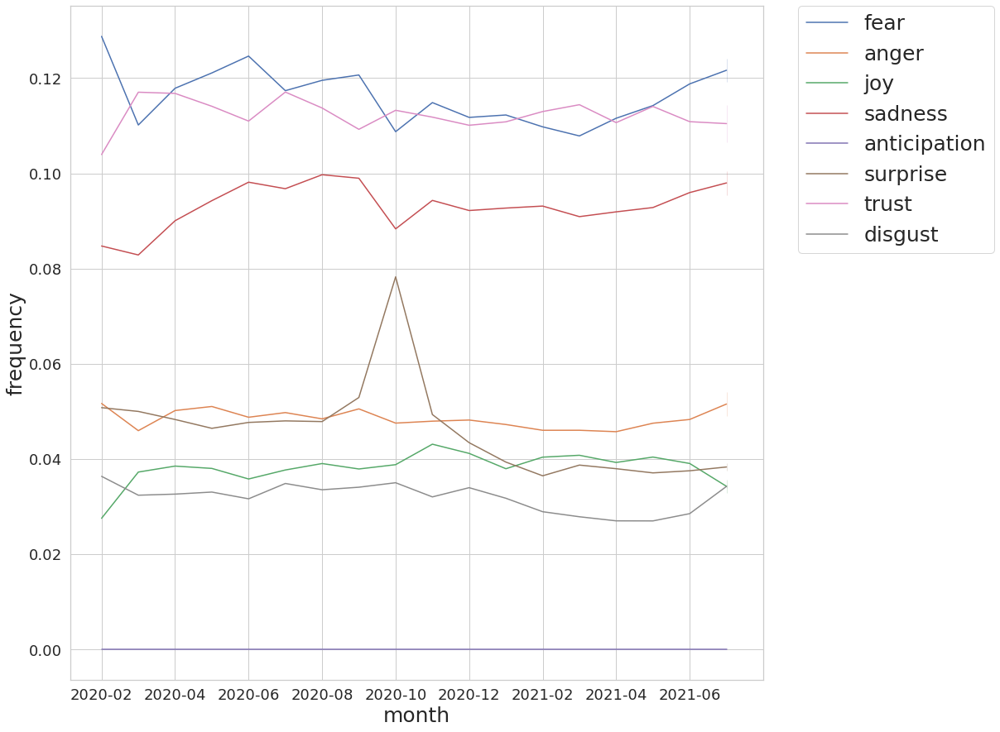

In [180]:
tweet_monthly_df = summarize_montly_data(tweet_df)
plot_monthly_emotion_freq(tweet_monthly_df, "tweet_line.pdf")

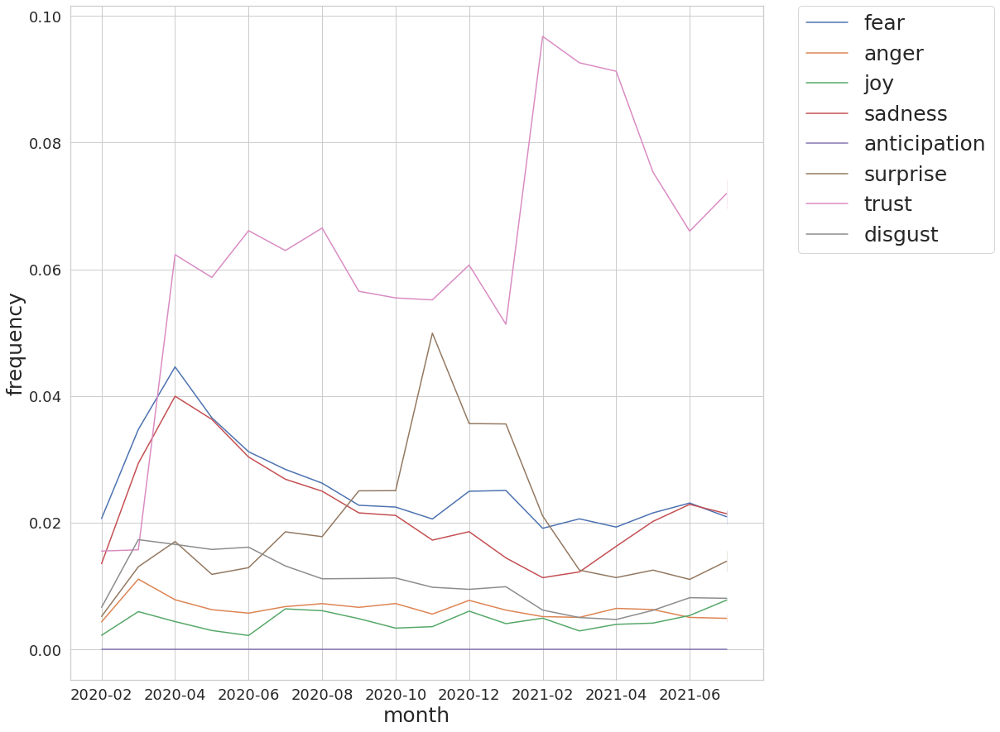

In [179]:
bing_monthly_df = summarize_montly_data(bing_df)
plot_monthly_emotion_freq(bing_monthly_df, "bing_line.pdf")